In [1]:
#IMPORT all necessary libraries and modules

#add path to sys so that we can import functions from other folders
import sys
import os

sys.path.append(r'C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\lib')

#import libraries 
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
pyo.init_notebook_mode()
import nbformat

import matplotlib.pyplot as plt
import seaborn as sns



#tqdm
from tqdm import tqdm

from monthly_forecast_run import run_monthly_forecast
from excel_agg_forecast import create_aggregate_report
from excel_forecast_report import create_forecast_report

from helper_functions import load_data
from helper_functions import grangers_causation_matrix
from helper_functions import cointegration_test
from helper_functions import adfuller_test
from helper_functions import invert_transformation
from helper_functions import forecast_accuracy
from helper_functions import get_best_predictors
from helper_functions import create_predictor_combinations
from helper_functions import run_var_for_all_combos

from models import var_model, arima




#import modules
import importlib
import models
import helper_functions
import dashboard
import residuals_analysis
import forecast
import armagarch as ag


#reload modules to ensure that changes made to them are reflected in the notebook
importlib.reload(models)
importlib.reload(helper_functions)
importlib.reload(dashboard)
importlib.reload(residuals_analysis)
importlib.reload(forecast)


%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from statsmodels.tsa.api import acf, graphics, pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order
import datetime as dt

#import varmax from models
from models import varmax

import regex as re

sns.set_style("darkgrid")
pd.plotting.register_matplotlib_converters()
# Default figure size
sns.mpl.rc("figure", figsize=(16, 6))
sns.mpl.rc("font", size=14)

#ignore warnings
import warnings
warnings.filterwarnings('ignore')






In [4]:
ury = pd.read_excel(r"C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\dat\2024\January\Banco de Uruguay Time Series.xlsx", sheet_name = 'Región País')

ury['Period'] = ury['Año'].astype(str) + '-' + ury['Mes'].astype(str).str.zfill(2)
ury['Period'] = pd.to_datetime(ury['Period'], format = '%Y-%m')
ury = ury.set_index('Period')
ury = ury.drop(columns = ['Año', 'Mes'])

ury = ury.dropna()
ury.tail()

#create pivot table
ury_pivot = ury.pivot_table(index = 'Period', columns = 'Division', values = 'Indice Total País')

ury_pivot = ury_pivot.dropna()
ury_pivot.head()

#% change
ury_pivot = ury_pivot.pct_change(12) * 100
ury_pivot = ury_pivot.dropna()



In [5]:
#get sheet names from ury2 file
ury = ury_pivot
sheet_names = pd.ExcelFile(r"C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\dat\2024\January\Banco de Uruguay Time Series.xlsx").sheet_names

for sheet in sheet_names[1:]:
    
    # #READ SHEET 2 AND RESAMPLE, THEN MERGE WITH ury
    ury2 = pd.read_excel(r"C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\dat\2024\January\Banco de Uruguay Time Series.xlsx", sheet_name = sheet)
    ury2.set_index('Period', inplace = True)

     

    ury = pd.merge(ury, ury2, how = 'left', left_index = True, right_index = True)

    if 'raw' in sheet:
        ury2 = ury2.pct_change(12) * 100
        ury2 = ury2.dropna()

#make 'YoY Increase Inflation' the first column
#cols = ury.columns.tolist()
#cols = cols[-1:] + cols[:-1]
#ury = ury[cols]
ury = ury.dropna()

ury = pd.merge(ury['YoY Increase Inflation'], ury.drop(columns = 'YoY Increase Inflation'), how = 'left', left_index = True, right_index = True)
ury.head()

,YoY Increase Inflation,ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS,"BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS","CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS",INFORMACIÓN Y COMUNICACIÓN,"MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES","RECREACIÓN, DEPORTE Y CULTURA",RESTAURANTES Y SERVICIOS DE ALOJAMIENTO,ROPA Y CALZADO,SALUD,SEGUROS Y SERVICIOS FINANCIEROS,SERVICIOS DE EDUCACIÓN,TRANSPORTE,"VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES",Indice Medio de Salario Real - Var 12 meses,PPI - Var 12 meses
Period,,,,,,,,,,,,,,,,
2011-12-01,8.600000,8.654536,7.208737,9.311958,0.465428,8.540544,9.861390,10.594526,4.537531,7.761094,8.174476,10.455756,10.224829,10.562098,3.98,11.13
2012-01-01,8.049383,6.786238,7.750794,9.751443,0.698586,6.699116,9.322556,11.033162,4.124011,7.309279,7.569745,10.613325,8.093746,12.504656,5.84,7.59
2012-02-01,7.935421,6.753811,7.530185,9.983196,0.394075,7.997015,4.504451,11.756653,3.690073,7.604071,8.368600,11.691691,8.431273,11.685817,5.55,5.60
2012-03-01,7.477086,6.936822,7.234619,9.452153,0.633211,7.943732,8.463614,10.785679,2.874300,7.648001,8.126431,12.043323,5.385269,9.926975,5.87,4.45
2012-04-01,7.990385,8.533379,7.236016,9.969456,0.908466,7.886769,8.161805,10.087922,2.823272,7.732740,7.979256,12.138097,6.550031,10.020161,4.75,4.92


In [ ]:
#show missing values as heatmap
ury.describe()

,YoY Increase Inflation,ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS,"BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS","CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS",INFORMACIÓN Y COMUNICACIÓN,"MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES","RECREACIÓN, DEPORTE Y CULTURA",RESTAURANTES Y SERVICIOS DE ALOJAMIENTO,ROPA Y CALZADO,SALUD,SEGUROS Y SERVICIOS FINANCIEROS,SERVICIOS DE EDUCACIÓN,TRANSPORTE,"VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES",Indice Medio de Salarios - General,Indice Medio de Salarios - Privado,Indice Medio de Salarios - Publico,Indice Medio de Salario Nominal - Var 12 meses,Indice Medio de Salario Real - Var 12 meses,PPI - Var 12 meses
count,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.00000,147.000000,147.000000,147.000000,147.000000,147.000000
mean,8.132441,9.052451,8.882377,8.632502,4.231779,8.326908,7.269054,9.460055,4.225688,9.001176,8.117910,10.286672,7.133010,7.961724,294.63415,303.806803,279.707483,9.902449,1.553333,7.059184
std,1.433774,3.613706,4.445064,2.222084,3.504253,2.830885,2.822642,2.127257,3.757634,1.346766,2.454155,2.397072,3.808218,2.426410,90.43775,92.853113,86.652317,2.218569,2.194513,7.254934
min,3.871174,-6.977061,1.558274,-5.093922,-7.449647,-3.279866,1.613344,-1.037071,-13.851702,5.952174,1.559167,1.131095,-5.920119,-1.703694,149.22000,153.930000,141.560000,5.300000,-3.130000,-12.420000
25%,7.477880,6.944591,6.440235,7.562772,1.422093,7.193992,5.313809,8.342879,2.884698,8.069616,6.406976,8.996111,5.307043,6.584259,216.34500,224.530000,203.025000,8.205000,-0.035000,3.380000
50%,8.257677,9.645484,7.677089,8.507148,4.077762,8.782044,7.425020,9.809793,4.313520,8.974843,8.359173,10.822715,7.161393,7.664995,295.67000,305.620000,279.360000,10.190000,1.770000,7.070000
75%,9.088023,10.892000,11.021531,9.807743,6.640208,9.924792,8.967390,10.702663,6.009209,9.636595,9.715757,12.148523,9.662964,9.492383,370.29500,379.175000,355.835000,11.465000,3.340000,10.815000
max,11.050771,23.227732,22.584342,19.696823,22.343925,22.138954,15.936806,18.298603,21.974076,13.029430,15.285160,14.246944,14.440209,14.656099,474.58000,487.870000,453.060000,15.080000,5.870000,22.940000


In [6]:
ury.columns

Index(['YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS',
       'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS',
       'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS',
       'INFORMACIÓN Y COMUNICACIÓN',
       'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES',
       'RECREACIÓN, DEPORTE Y CULTURA',
       'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'ROPA Y CALZADO', 'SALUD',
       'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN',
       'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES',
       'Indice Medio de Salario  Real - Var 12 meses', 'PPI - Var 12 meses'],
      dtype='object')

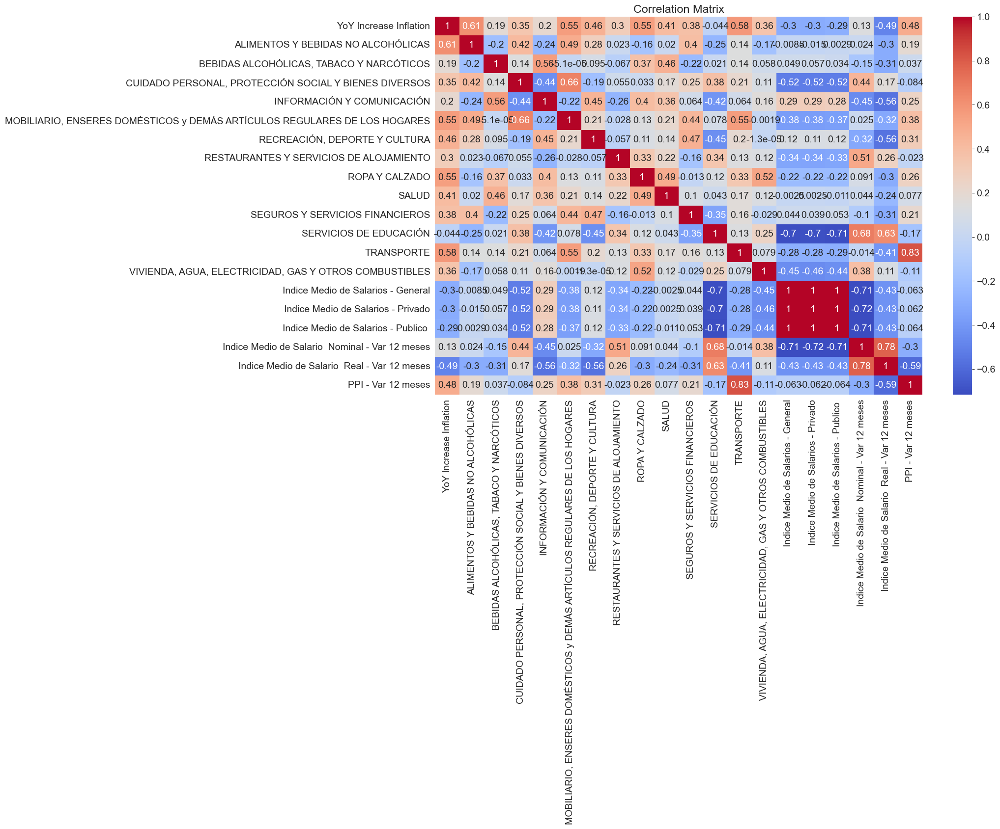

In [ ]:
#create correlation matrix and heatmap
corr_matrix = ury.corr()
plt.figure(figsize = (16, 10))
sns.heatmap(corr_matrix, annot = True, cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
#check if all items in list g are greater than 0
g = corr_matrix['YoY Increase Inflation'].values
all(i > 0 for i in g) 

False

In [ ]:
# #check for stationarity
# def adf_test(df):
#     all_g = []
#     for col in df.columns:
#         g = adfuller_test(df[col], col)
#         all_g.append(g)
#     return all(i < 0.05 for i in all_g)

# g = adf_test(ury)
# if g:
#     print('All series are stationary')
# else:
#     print('Some series are not stationary')
#     h = adf_test(ury.diff().dropna())
#     if h:
#         print('Difference 1x, all series are stationary')
#     else:
#         k = adf_test(ury.diff().diff().dropna())
#         if k:
#             print('Difference 2x, all series are stationary')
#         else:
#             print('Difference 2x, still not stationary')



                 

In [7]:
causality_matrix = grangers_causation_matrix(ury, variables = ury.columns)
causality_matrix



differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - tes

,YoY Increase Inflation_x,ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS_x,"BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS_x","CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS_x",INFORMACIÓN Y COMUNICACIÓN_x,"MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES_x","RECREACIÓN, DEPORTE Y CULTURA_x",RESTAURANTES Y SERVICIOS DE ALOJAMIENTO_x,ROPA Y CALZADO_x,SALUD_x,SEGUROS Y SERVICIOS FINANCIEROS_x,SERVICIOS DE EDUCACIÓN_x,TRANSPORTE_x,"VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES_x",Indice Medio de Salario Real - Var 12 meses_x,PPI - Var 12 meses_x
YoY Increase Inflation_y,1.0000,0.3249,0.0488,0.1563,0.2213,0.0581,0.0164,0.0372,0.2677,0.0068,0.1465,0.3219,0.0003,0.0010,0.0514,0.0000
ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS_y,0.0002,1.0000,0.1655,0.0000,0.0107,0.0211,0.1678,0.0268,0.0000,0.1032,0.0018,0.0191,0.1419,0.2128,0.0986,0.0456
"BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS_y",0.0923,0.2099,1.0000,0.1612,0.0946,0.1874,0.0446,0.4420,0.1495,0.0460,0.0766,0.1087,0.0094,0.2514,0.3887,0.0259
"CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS_y",0.2003,0.1166,0.8092,1.0000,0.3104,0.7310,0.4977,0.9529,0.0238,0.3839,0.0157,0.5151,0.1175,0.7344,0.0922,0.0935
INFORMACIÓN Y COMUNICACIÓN_y,0.0592,0.0981,0.3743,0.0096,1.0000,0.0364,0.0141,0.7968,0.0058,0.3907,0.0001,0.0374,0.0081,0.6964,0.3127,0.0212
"MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES_y",0.2666,0.0875,0.2717,0.0192,0.0165,1.0000,0.1202,0.4511,0.0115,0.3751,0.3396,0.6647,0.3257,0.2452,0.0450,0.1172
"RECREACIÓN, DEPORTE Y CULTURA_y",0.0000,0.0524,0.1911,0.1123,0.2388,0.0561,1.0000,0.1782,0.1464,0.0655,0.0508,0.0000,0.0135,0.0050,0.0002,0.3207
RESTAURANTES Y SERVICIOS DE ALOJAMIENTO_y,0.0469,0.3820,0.5825,0.8458,0.6564,0.5970,0.0947,1.0000,0.7303,0.3090,0.8230,0.0000,0.0371,0.2710,0.0044,0.0129
ROPA Y CALZADO_y,0.0007,0.0004,0.4972,0.0000,0.3377,0.0572,0.3512,0.7978,1.0000,0.6767,0.0008,0.6892,0.0071,0.7687,0.2542,0.0009
SALUD_y,0.0021,0.2453,0.0196,0.0495,0.0029,0.1985,0.0001,0.0005,0.1590,1.0000,0.0132,0.0754,0.0355,0.0004,0.0000,0.0084


In [21]:
final_predictors = get_best_predictors(causality_matrix)
final_predictors
#insert 'YoY Increase Inflation' as the first predictor
final_predictors

['YoY Increase Inflation_y',
 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS_y',
 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS_y',
 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS_y',
 'INFORMACIÓN Y COMUNICACIÓN_y',
 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES_y',
 'RECREACIÓN, DEPORTE Y CULTURA_y',
 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO_y',
 'ROPA Y CALZADO_y',
 'SALUD_y',
 'SEGUROS Y SERVICIOS FINANCIEROS_y',
 'SERVICIOS DE EDUCACIÓN_y',
 'TRANSPORTE_y',
 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES_y',
 'Indice Medio de Salario  Real - Var 12 meses_y',
 'PPI - Var 12 meses_y']

In [ ]:
len(final_predictors)

20

In [22]:
components = final_predictors[:-2]
non_components = final_predictors[-2:]


In [ ]:
# #calculate VIF for ppi_list
# from tqdm import tqdm 

# ppi_list = ppi_list
# from statsmodels.stats.outliers_influence import variance_inflation_factor

# #create all possible combinations of ppi_list 
# ppi_combos = create_predictor_combinations(ppi_list)
# print(ppi_combos)

# # Create a DataFrame for VIF
# vif_data = []
# best_combos = pd.DataFrame()
# for combo in tqdm(ppi_combos):
#     vif_data = [variance_inflation_factor(ury[list(combo)].values, i)
#                        for i in range(len(combo))]
#     if max(vif_data) < 10:
#         best_combos = best_combos.append({'combo': combo, 'worst_vif': max(vif_data)}, ignore_index=True)
#         print (combo, vif_data)

# print(best_combos)





In [ ]:

#max width of the dataframe
pd.set_option('display.max_colwidth', None)


In [ ]:
# #remove highly correlated variables

# # Set the correlation threshold
# correlation_threshold = 0.8

# # Create a list to store the variables with low correlation
# ppi_list_filtered = []

# # Iterate over the ppi_list and check the correlation with other variables
# for variable in ppi_list:
#     if all(abs(corr_matrix[variable]) < correlation_threshold):
#         ppi_list_filtered.append(variable)

# # Print the filtered ppi_list
# ppi_list_filtered


In [23]:
# remove _y from the end of the column names
non_components = [re.sub('_y$', '', col) for col in non_components]
components = [re.sub('_y$', '', col) for col in components]

In [30]:
components.remove('YoY Increase Inflation')

ValueError: list.remove(x): x not in list

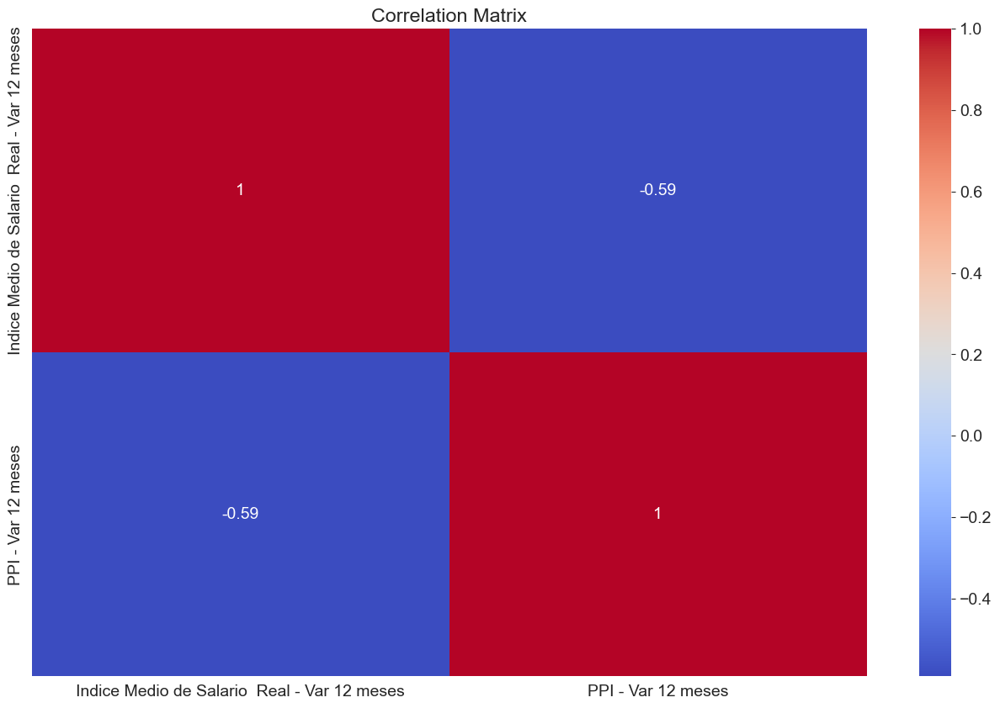

In [11]:
#show correlation heatmap of non_components
plt.figure(figsize = (16, 10))
sns.heatmap(ury[non_components].corr(), annot = True, cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [31]:
ury_breakdown_results = run_var_for_all_combos(ury, components)


8191


  0%|          | 2/8191 [00:00<07:45, 17.59it/s]

Lowest MAPE:  0.43600817479121384 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS')
Lowest MAPE:  0.23225872410282744 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS')
Lowest MAPE:  0.23225872410282744 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS')


  0%|          | 5/8191 [00:00<06:54, 19.76it/s]

Lowest MAPE:  0.23225872410282744 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS')
Lowest MAPE:  0.23225872410282744 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS')


  0%|          | 7/8191 [00:00<07:04, 19.30it/s]

Lowest MAPE:  0.23225872410282744 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 9/8191 [00:00<07:03, 19.34it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 11/8191 [00:00<07:25, 18.37it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 13/8191 [00:00<07:30, 18.17it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 15/8191 [00:00<08:54, 15.28it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 17/8191 [00:01<09:32, 14.27it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 19/8191 [00:01<12:29, 10.90it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 21/8191 [00:01<11:34, 11.77it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 23/8191 [00:01<10:59, 12.39it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 25/8191 [00:01<10:26, 13.04it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 27/8191 [00:01<10:51, 12.53it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 29/8191 [00:02<11:53, 11.44it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 31/8191 [00:02<13:00, 10.45it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE: 

  0%|          | 33/8191 [00:02<13:23, 10.15it/s]

 0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 36/8191 [00:03<16:54,  8.04it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 38/8191 [00:03<14:58,  9.07it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  0%|          | 40/8191 [00:03<13:55,  9.75it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 44/8191 [00:03<13:10, 10.31it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 48/8191 [00:04<10:55, 12.43it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 52/8191 [00:04<10:11, 13.31it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 56/8191 [00:04<09:20, 14.52it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 60/8191 [00:04<09:12, 14.70it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 62/8191 [00:04<09:01, 15.02it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 66/8191 [00:05<09:36, 14.09it/s]

Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 70/8191 [00:05<09:22, 14.43it/s]

Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 72/8191 [00:05<10:01, 13.49it/s]

Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  1%|          | 76/8191 [00:06<10:42, 12.63it/s]

Lowest MAPE:  0.16037486090675676 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 78/8191 [00:06<11:55, 11.34it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 82/8191 [00:06<10:32, 12.81it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 86/8191 [00:06<09:43, 13.90it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 90/8191 [00:07<09:14, 14.61it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 92/8191 [00:07<09:54, 13.62it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 94/8191 [00:07<11:49, 11.41it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 96/8191 [00:07<12:50, 10.50it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 98/8191 [00:07<13:31,  9.97it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')


  1%|          | 100/8191 [00:08<13:56,  9.67it/s]

Lowest MAPE:  0.15677354189836554 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 104/8191 [00:08<13:35,  9.91it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 106/8191 [00:08<16:17,  8.27it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 108/8191 [00:09<15:25,  8.73it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 112/8191 [00:09<13:00, 10.36it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 114/8191 [00:09<12:35, 10.69it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 116/8191 [00:09<13:07, 10.25it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 120/8191 [00:10<12:02, 11.17it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  1%|▏         | 122/8191 [00:10<11:56, 11.26it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  2%|▏         | 126/8191 [00:10<12:05, 11.12it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  2%|▏         | 128/8191 [00:10<11:34, 11.61it/s]

Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')
Lowest MAPE:  0.15313326739639582 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'TRANSPORTE')


  2%|▏         | 132/8191 [00:11<11:31, 11.66it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 134/8191 [00:11<12:48, 10.48it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 136/8191 [00:11<12:27, 10.78it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 138/8191 [00:11<13:31,  9.93it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 141/8191 [00:12<14:39,  9.15it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 144/8191 [00:12<13:38,  9.83it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 146/8191 [00:12<12:45, 10.52it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 150/8191 [00:12<11:45, 11.39it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 152/8191 [00:13<11:26, 11.72it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 156/8191 [00:13<11:08, 12.02it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 158/8191 [00:13<11:30, 11.63it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 161/8191 [00:14<15:30,  8.63it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 163/8191 [00:14<16:12,  8.26it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 165/8191 [00:14<16:02,  8.34it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 167/8191 [00:14<16:01,  8.35it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 169/8191 [00:15<15:28,  8.64it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 173/8191 [00:15<14:06,  9.47it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 175/8191 [00:15<14:19,  9.32it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 177/8191 [00:15<14:17,  9.35it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 181/8191 [00:16<14:09,  9.43it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 183/8191 [00:16<17:12,  7.75it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 185/8191 [00:16<16:55,  7.88it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 186/8191 [00:17<16:33,  8.06it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 189/8191 [00:17<17:22,  7.67it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 191/8191 [00:17<16:06,  8.28it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 195/8191 [00:18<14:23,  9.26it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 197/8191 [00:18<14:35,  9.13it/s]

Lowest MAPE:  0.1502843941269589 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  2%|▏         | 200/8191 [00:18<14:57,  8.91it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  2%|▏         | 202/8191 [00:18<15:52,  8.39it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  2%|▏         | 203/8191 [00:18<16:46,  7.94it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 205/8191 [00:19<24:29,  5.44it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 207/8191 [00:19<23:18,  5.71it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 209/8191 [00:20<21:05,  6.31it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 211/8191 [00:20<19:03,  6.98it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 214/8191 [00:20<14:46,  9.00it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 216/8191 [00:20<17:35,  7.55it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 218/8191 [00:21<15:50,  8.39it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 222/8191 [00:21<14:45,  9.00it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 224/8191 [00:21<15:43,  8.44it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 226/8191 [00:22<18:13,  7.28it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 230/8191 [00:22<14:51,  8.93it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 233/8191 [00:22<13:13, 10.03it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 235/8191 [00:23<13:27,  9.86it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 237/8191 [00:23<17:54,  7.40it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 238/8191 [00:23<19:53,  6.66it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 239/8191 [00:24<26:04,  5.08it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 240/8191 [00:24<34:03,  3.89it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 242/8191 [00:24<33:44,  3.93it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 244/8191 [00:25<29:54,  4.43it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 246/8191 [00:25<24:15,  5.46it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 248/8191 [00:25<21:40,  6.11it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 250/8191 [00:26<19:43,  6.71it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 252/8191 [00:26<19:34,  6.76it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 254/8191 [00:26<18:35,  7.12it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 255/8191 [00:26<20:45,  6.37it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 256/8191 [00:27<25:55,  5.10it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 258/8191 [00:27<28:27,  4.65it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 259/8191 [00:27<29:48,  4.43it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 261/8191 [00:28<27:32,  4.80it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 263/8191 [00:28<21:28,  6.15it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 266/8191 [00:28<17:28,  7.56it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 268/8191 [00:29<15:45,  8.38it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 270/8191 [00:29<15:44,  8.39it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 273/8191 [00:29<15:15,  8.65it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 275/8191 [00:30<16:08,  8.17it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 276/8191 [00:30<16:07,  8.18it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 277/8191 [00:30<22:07,  5.96it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 278/8191 [00:30<23:54,  5.52it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 280/8191 [00:30<23:02,  5.72it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  3%|▎         | 283/8191 [00:31<16:52,  7.81it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 287/8191 [00:31<13:19,  9.88it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 289/8191 [00:31<12:20, 10.67it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 293/8191 [00:32<11:14, 11.70it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 295/8191 [00:32<11:24, 11.53it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 299/8191 [00:32<11:01, 11.93it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 301/8191 [00:32<12:13, 10.76it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 303/8191 [00:33<13:55,  9.44it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▎         | 305/8191 [00:33<18:42,  7.03it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▍         | 308/8191 [00:33<15:49,  8.31it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▍         | 310/8191 [00:34<13:56,  9.43it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▍         | 314/8191 [00:34<12:08, 10.81it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▍         | 316/8191 [00:34<11:35, 11.32it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▍         | 320/8191 [00:34<11:36, 11.31it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▍         | 322/8191 [00:35<12:42, 10.31it/s]

Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')
Lowest MAPE:  0.14590394799679046 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES')


  4%|▍         | 324/8191 [00:35<16:33,  7.92it/s]

Lowest MAPE:  0.1403014214238053 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SALUD')
Lowest MAPE:  0.1403014214238053 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SALUD')


  4%|▍         | 326/8191 [00:35<17:42,  7.40it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 328/8191 [00:36<19:04,  6.87it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 330/8191 [00:36<16:46,  7.81it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 334/8191 [00:36<13:37,  9.62it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 336/8191 [00:36<14:06,  9.28it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 338/8191 [00:37<14:05,  9.29it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 340/8191 [00:37<14:54,  8.78it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 342/8191 [00:37<14:48,  8.83it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 344/8191 [00:37<16:23,  7.98it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 346/8191 [00:38<17:22,  7.53it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 348/8191 [00:38<21:18,  6.13it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 350/8191 [00:38<20:08,  6.49it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 352/8191 [00:39<18:39,  7.00it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 354/8191 [00:39<19:05,  6.84it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 356/8191 [00:39<19:45,  6.61it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 358/8191 [00:39<18:09,  7.19it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 360/8191 [00:40<15:34,  8.38it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 362/8191 [00:40<15:00,  8.70it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 364/8191 [00:40<17:42,  7.37it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 366/8191 [00:40<17:08,  7.61it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  4%|▍         | 368/8191 [00:41<15:56,  8.17it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 370/8191 [00:41<15:34,  8.37it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 372/8191 [00:41<15:42,  8.30it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 374/8191 [00:41<15:39,  8.32it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 376/8191 [00:42<14:43,  8.85it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 378/8191 [00:42<16:56,  7.68it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 380/8191 [00:42<20:34,  6.33it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 381/8191 [00:42<21:36,  6.03it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 383/8191 [00:43<25:00,  5.20it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 385/8191 [00:43<24:22,  5.34it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 387/8191 [00:44<24:41,  5.27it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 389/8191 [00:44<23:24,  5.56it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 391/8191 [00:44<23:16,  5.59it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 393/8191 [00:45<22:35,  5.75it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 394/8191 [00:45<22:05,  5.88it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 397/8191 [00:45<24:52,  5.22it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 398/8191 [00:46<25:01,  5.19it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 399/8191 [00:46<27:29,  4.72it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 400/8191 [00:46<27:45,  4.68it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 401/8191 [00:46<28:35,  4.54it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 402/8191 [00:47<31:17,  4.15it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 405/8191 [00:47<25:31,  5.08it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 407/8191 [00:48<23:28,  5.53it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▍         | 408/8191 [00:48<22:35,  5.74it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 410/8191 [00:48<23:28,  5.52it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 411/8191 [00:48<29:24,  4.41it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 413/8191 [00:49<28:59,  4.47it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 415/8191 [00:49<25:15,  5.13it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 417/8191 [00:50<23:09,  5.59it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 419/8191 [00:50<23:14,  5.57it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 420/8191 [00:50<24:37,  5.26it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 422/8191 [00:51<26:15,  4.93it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 424/8191 [00:51<24:53,  5.20it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 426/8191 [00:51<25:50,  5.01it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 427/8191 [00:52<26:42,  4.84it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 428/8191 [00:52<33:01,  3.92it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 429/8191 [00:52<41:22,  3.13it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 430/8191 [00:53<50:42,  2.55it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 431/8191 [00:54<58:07,  2.22it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 432/8191 [00:54<58:43,  2.20it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 433/8191 [00:55<1:05:00,  1.99it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 434/8191 [00:55<1:02:15,  2.08it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 435/8191 [00:56<1:03:59,  2.02it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 436/8191 [00:56<55:13,  2.34it/s]  

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 437/8191 [00:56<1:00:13,  2.15it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 438/8191 [00:57<55:40,  2.32it/s]  

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 439/8191 [00:57<49:32,  2.61it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 440/8191 [00:57<44:42,  2.89it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 441/8191 [00:58<42:14,  3.06it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 442/8191 [00:58<42:05,  3.07it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 443/8191 [00:58<45:19,  2.85it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 444/8191 [00:59<41:08,  3.14it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 445/8191 [00:59<43:10,  2.99it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 446/8191 [01:00<59:17,  2.18it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 447/8191 [01:00<56:38,  2.28it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 448/8191 [01:00<52:07,  2.48it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 449/8191 [01:01<50:05,  2.58it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  5%|▌         | 450/8191 [01:01<51:12,  2.52it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 451/8191 [01:02<52:58,  2.44it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 452/8191 [01:02<50:34,  2.55it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 453/8191 [01:02<49:47,  2.59it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 456/8191 [01:03<33:50,  3.81it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 457/8191 [01:03<36:34,  3.52it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 459/8191 [01:04<33:40,  3.83it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 460/8191 [01:04<32:52,  3.92it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 461/8191 [01:04<32:11,  4.00it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 462/8191 [01:04<32:53,  3.92it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 463/8191 [01:05<32:55,  3.91it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 464/8191 [01:05<33:46,  3.81it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 465/8191 [01:05<31:39,  4.07it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 466/8191 [01:06<33:46,  3.81it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 467/8191 [01:06<45:42,  2.82it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 468/8191 [01:07<51:26,  2.50it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 469/8191 [01:07<45:24,  2.83it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 470/8191 [01:07<44:37,  2.88it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 471/8191 [01:07<41:22,  3.11it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 472/8191 [01:08<39:34,  3.25it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 473/8191 [01:08<42:02,  3.06it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 475/8191 [01:09<35:41,  3.60it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 477/8191 [01:09<32:57,  3.90it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 478/8191 [01:09<34:05,  3.77it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 480/8191 [01:10<31:23,  4.09it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 481/8191 [01:10<29:14,  4.39it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 482/8191 [01:10<29:30,  4.36it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 484/8191 [01:11<27:48,  4.62it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 485/8191 [01:11<27:10,  4.73it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 486/8191 [01:11<33:46,  3.80it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 487/8191 [01:12<36:16,  3.54it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 488/8191 [01:12<34:21,  3.74it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 489/8191 [01:12<33:14,  3.86it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 490/8191 [01:12<35:40,  3.60it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 492/8191 [01:13<30:05,  4.27it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 493/8191 [01:13<29:57,  4.28it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 495/8191 [01:13<29:32,  4.34it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 498/8191 [01:14<26:45,  4.79it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 500/8191 [01:14<22:51,  5.61it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 502/8191 [01:15<20:11,  6.34it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 504/8191 [01:15<18:09,  7.05it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 506/8191 [01:15<16:56,  7.56it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 508/8191 [01:15<16:29,  7.76it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 509/8191 [01:15<16:20,  7.84it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▌         | 511/8191 [01:16<19:01,  6.73it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 513/8191 [01:16<16:24,  7.80it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 515/8191 [01:16<17:22,  7.37it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 517/8191 [01:17<16:43,  7.64it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 519/8191 [01:17<16:10,  7.90it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 522/8191 [01:17<16:56,  7.54it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 524/8191 [01:18<18:12,  7.02it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 526/8191 [01:18<17:51,  7.16it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 528/8191 [01:18<16:50,  7.58it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 530/8191 [01:18<17:12,  7.42it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  6%|▋         | 532/8191 [01:19<17:45,  7.19it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 534/8191 [01:19<16:49,  7.58it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 536/8191 [01:19<16:16,  7.84it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 538/8191 [01:19<15:09,  8.42it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 540/8191 [01:20<15:16,  8.35it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 543/8191 [01:20<15:46,  8.08it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 545/8191 [01:20<17:54,  7.11it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 547/8191 [01:21<19:13,  6.63it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 549/8191 [01:21<16:23,  7.77it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 550/8191 [01:21<16:33,  7.69it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 552/8191 [01:21<19:25,  6.55it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 554/8191 [01:22<17:22,  7.32it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 556/8191 [01:22<16:39,  7.64it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 558/8191 [01:22<15:59,  7.96it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 560/8191 [01:22<15:16,  8.32it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 562/8191 [01:22<14:51,  8.55it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 564/8191 [01:23<17:02,  7.46it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 566/8191 [01:23<18:56,  6.71it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 567/8191 [01:23<18:45,  6.78it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 569/8191 [01:24<22:23,  5.67it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 571/8191 [01:24<19:40,  6.46it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 573/8191 [01:24<19:05,  6.65it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 575/8191 [01:25<18:41,  6.79it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 577/8191 [01:25<19:01,  6.67it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 579/8191 [01:25<16:41,  7.60it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 581/8191 [01:25<16:47,  7.55it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 583/8191 [01:26<19:03,  6.65it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 585/8191 [01:26<18:11,  6.97it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 587/8191 [01:26<22:56,  5.53it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 589/8191 [01:27<21:08,  5.99it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 591/8191 [01:27<17:49,  7.10it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 593/8191 [01:27<16:13,  7.80it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 595/8191 [01:27<16:44,  7.56it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 597/8191 [01:28<15:58,  7.92it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 599/8191 [01:28<17:11,  7.36it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 601/8191 [01:28<18:14,  6.94it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 603/8191 [01:29<19:57,  6.34it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 605/8191 [01:29<24:31,  5.16it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 607/8191 [01:29<22:05,  5.72it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 609/8191 [01:30<20:02,  6.30it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 611/8191 [01:30<19:30,  6.47it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  7%|▋         | 613/8191 [01:30<18:39,  6.77it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 615/8191 [01:31<18:19,  6.89it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 617/8191 [01:31<18:25,  6.85it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 619/8191 [01:31<18:48,  6.71it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 620/8191 [01:31<18:37,  6.77it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 622/8191 [01:32<26:18,  4.80it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 624/8191 [01:32<22:51,  5.52it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 626/8191 [01:32<20:42,  6.09it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 628/8191 [01:33<19:41,  6.40it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 630/8191 [01:33<19:27,  6.47it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 632/8191 [01:33<19:04,  6.60it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 634/8191 [01:34<18:46,  6.71it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 635/8191 [01:34<18:18,  6.88it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 637/8191 [01:34<22:28,  5.60it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 639/8191 [01:35<21:03,  5.98it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 641/8191 [01:35<19:38,  6.40it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 643/8191 [01:35<20:06,  6.25it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 645/8191 [01:35<21:04,  5.97it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 647/8191 [01:36<20:43,  6.07it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 649/8191 [01:36<20:13,  6.22it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 651/8191 [01:36<20:14,  6.21it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 653/8191 [01:37<22:54,  5.48it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 655/8191 [01:37<21:40,  5.79it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 657/8191 [01:38<20:34,  6.10it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 659/8191 [01:38<19:35,  6.41it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 661/8191 [01:38<17:43,  7.08it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 663/8191 [01:38<18:35,  6.75it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 665/8191 [01:39<18:27,  6.79it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 667/8191 [01:39<18:54,  6.63it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 668/8191 [01:39<18:37,  6.73it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 670/8191 [01:40<22:50,  5.49it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 672/8191 [01:40<20:02,  6.25it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 674/8191 [01:40<18:55,  6.62it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 676/8191 [01:41<20:57,  5.98it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 678/8191 [01:41<20:13,  6.19it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 680/8191 [01:41<20:04,  6.23it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 682/8191 [01:41<20:03,  6.24it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 683/8191 [01:42<19:52,  6.30it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 685/8191 [01:42<23:20,  5.36it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 687/8191 [01:42<20:49,  6.01it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 689/8191 [01:43<19:40,  6.35it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 691/8191 [01:43<19:18,  6.48it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 692/8191 [01:43<19:02,  6.56it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 693/8191 [01:43<22:51,  5.47it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 694/8191 [01:44<26:05,  4.79it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 695/8191 [01:44<26:34,  4.70it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  8%|▊         | 696/8191 [01:44<35:51,  3.48it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 697/8191 [01:45<39:16,  3.18it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 698/8191 [01:45<37:27,  3.33it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 699/8191 [01:45<34:59,  3.57it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 702/8191 [01:46<28:15,  4.42it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 704/8191 [01:46<23:12,  5.38it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 705/8191 [01:46<22:45,  5.48it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 707/8191 [01:47<24:49,  5.02it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 708/8191 [01:47<24:35,  5.07it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 709/8191 [01:47<27:26,  4.54it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 711/8191 [01:48<26:51,  4.64it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 713/8191 [01:48<25:08,  4.96it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▊         | 715/8191 [01:48<23:06,  5.39it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 717/8191 [01:49<21:37,  5.76it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 719/8191 [01:49<20:07,  6.19it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 721/8191 [01:49<20:30,  6.07it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 723/8191 [01:50<20:37,  6.04it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 724/8191 [01:50<26:18,  4.73it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 726/8191 [01:50<25:47,  4.83it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 728/8191 [01:51<24:24,  5.10it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 730/8191 [01:51<22:28,  5.53it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 731/8191 [01:51<23:23,  5.32it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 733/8191 [01:52<22:53,  5.43it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 735/8191 [01:52<20:15,  6.13it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 737/8191 [01:52<21:19,  5.83it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 739/8191 [01:53<23:11,  5.36it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 741/8191 [01:53<20:47,  5.97it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 743/8191 [01:53<19:33,  6.35it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 745/8191 [01:54<18:57,  6.55it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 747/8191 [01:54<19:23,  6.40it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 749/8191 [01:54<19:10,  6.47it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 751/8191 [01:55<18:04,  6.86it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 753/8191 [01:55<17:18,  7.16it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 755/8191 [01:55<20:55,  5.93it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 757/8191 [01:55<20:08,  6.15it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 759/8191 [01:56<19:42,  6.28it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 761/8191 [01:56<18:27,  6.71it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 763/8191 [01:56<17:03,  7.26it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 765/8191 [01:57<16:43,  7.40it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 767/8191 [01:57<15:47,  7.83it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 769/8191 [01:57<17:29,  7.07it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 771/8191 [01:57<18:18,  6.75it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 773/8191 [01:58<16:29,  7.49it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 775/8191 [01:58<15:03,  8.21it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


  9%|▉         | 778/8191 [01:58<15:46,  7.83it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 780/8191 [01:59<17:18,  7.14it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 782/8191 [01:59<17:48,  6.93it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 784/8191 [01:59<16:09,  7.64it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 786/8191 [01:59<15:13,  8.11it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 788/8191 [02:00<16:28,  7.49it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 790/8191 [02:00<16:27,  7.50it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 792/8191 [02:00<16:28,  7.48it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 794/8191 [02:00<16:15,  7.58it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 796/8191 [02:01<15:32,  7.93it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 798/8191 [02:01<16:55,  7.28it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 799/8191 [02:01<17:58,  6.86it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 801/8191 [02:02<18:51,  6.53it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|▉         | 804/8191 [02:02<18:07,  6.79it/s]

Lowest MAPE:  0.10947635609936564 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|▉         | 806/8191 [02:02<18:06,  6.80it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|▉         | 808/8191 [02:03<18:49,  6.54it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|▉         | 810/8191 [02:03<19:07,  6.43it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|▉         | 812/8191 [02:03<18:07,  6.78it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|▉         | 814/8191 [02:03<16:31,  7.44it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|▉         | 816/8191 [02:04<15:22,  8.00it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|▉         | 818/8191 [02:04<15:03,  8.16it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|█         | 820/8191 [02:04<17:46,  6.91it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|█         | 822/8191 [02:04<15:14,  8.06it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|█         | 825/8191 [02:05<13:15,  9.26it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|█         | 827/8191 [02:05<14:22,  8.54it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|█         | 829/8191 [02:05<16:08,  7.60it/s]

Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')
Lowest MAPE:  0.10793277655662055 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE')


 10%|█         | 831/8191 [02:06<17:51,  6.87it/s]

Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 833/8191 [02:06<18:04,  6.79it/s]

Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 834/8191 [02:06<19:58,  6.14it/s]

Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 835/8191 [02:06<27:47,  4.41it/s]

Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 837/8191 [02:07<24:59,  4.90it/s]

Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 838/8191 [02:07<24:36,  4.98it/s]

Lowest MAPE:  0.09872865231404386 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 839/8191 [02:07<28:46,  4.26it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 840/8191 [02:08<28:28,  4.30it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 841/8191 [02:08<35:13,  3.48it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 842/8191 [02:08<40:25,  3.03it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 843/8191 [02:09<38:22,  3.19it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 844/8191 [02:09<39:40,  3.09it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 845/8191 [02:10<45:57,  2.66it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 847/8191 [02:10<35:25,  3.45it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 849/8191 [02:10<30:10,  4.06it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 851/8191 [02:11<29:05,  4.21it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 853/8191 [02:11<26:42,  4.58it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 855/8191 [02:12<23:20,  5.24it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 857/8191 [02:12<21:22,  5.72it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 859/8191 [02:12<24:55,  4.90it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 10%|█         | 860/8191 [02:13<24:31,  4.98it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 863/8191 [02:13<20:18,  6.01it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 865/8191 [02:13<17:15,  7.08it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 867/8191 [02:14<15:26,  7.90it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 869/8191 [02:14<15:04,  8.09it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 871/8191 [02:14<15:10,  8.04it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 873/8191 [02:14<14:47,  8.24it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 874/8191 [02:14<15:02,  8.11it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 876/8191 [02:15<20:05,  6.07it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 878/8191 [02:15<17:24,  7.00it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 880/8191 [02:15<15:26,  7.89it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 882/8191 [02:15<14:57,  8.14it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 884/8191 [02:16<16:26,  7.41it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 886/8191 [02:16<15:44,  7.74it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 888/8191 [02:16<15:14,  7.98it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 890/8191 [02:17<15:58,  7.62it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 892/8191 [02:17<20:12,  6.02it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 894/8191 [02:17<19:12,  6.33it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 896/8191 [02:18<16:46,  7.25it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 899/8191 [02:18<14:09,  8.59it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 902/8191 [02:18<13:32,  8.97it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 904/8191 [02:18<14:42,  8.26it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 906/8191 [02:19<14:14,  8.53it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 908/8191 [02:19<17:49,  6.81it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 910/8191 [02:19<15:56,  7.61it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 912/8191 [02:19<17:01,  7.13it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 914/8191 [02:20<17:02,  7.12it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 916/8191 [02:20<17:32,  6.91it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 919/8191 [02:20<14:41,  8.25it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█         | 921/8191 [02:21<13:04,  9.26it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 924/8191 [02:21<14:58,  8.09it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 926/8191 [02:21<14:55,  8.11it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 928/8191 [02:21<14:35,  8.30it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 930/8191 [02:22<14:19,  8.45it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 932/8191 [02:22<14:47,  8.18it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 934/8191 [02:22<17:13,  7.02it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 936/8191 [02:23<18:25,  6.56it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 937/8191 [02:23<18:45,  6.45it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 939/8191 [02:23<22:01,  5.49it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 11%|█▏        | 941/8191 [02:24<20:21,  5.94it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 943/8191 [02:24<20:07,  6.00it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 945/8191 [02:24<18:45,  6.44it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 947/8191 [02:24<17:10,  7.03it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 949/8191 [02:25<15:30,  7.78it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 951/8191 [02:25<15:07,  7.98it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 953/8191 [02:25<17:56,  6.72it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 955/8191 [02:25<16:35,  7.27it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 957/8191 [02:26<14:59,  8.04it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 959/8191 [02:26<14:17,  8.43it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 961/8191 [02:26<14:32,  8.28it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 964/8191 [02:27<13:22,  9.01it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 966/8191 [02:27<12:18,  9.78it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 967/8191 [02:27<13:05,  9.19it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 969/8191 [02:27<18:48,  6.40it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 971/8191 [02:28<18:00,  6.68it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 973/8191 [02:28<15:56,  7.54it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 975/8191 [02:28<14:40,  8.20it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 977/8191 [02:28<14:33,  8.26it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 979/8191 [02:28<14:09,  8.49it/s]

Lowest MAPE:  0.09054407597415919 Best Combination:  ('YoY Increase Inflation', 'CUIDADO PERSONAL, PROTECCIÓN SOCIAL Y BIENES DIVERSOS', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 980/8191 [02:29<14:05,  8.53it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 982/8191 [02:29<17:05,  7.03it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 984/8191 [02:29<16:02,  7.49it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 986/8191 [02:29<14:10,  8.47it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 989/8191 [02:30<15:40,  7.66it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 991/8191 [02:30<15:47,  7.60it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 993/8191 [02:30<16:25,  7.31it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 994/8191 [02:31<16:56,  7.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 996/8191 [02:31<20:23,  5.88it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 998/8191 [02:31<20:18,  5.90it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1000/8191 [02:32<20:15,  5.92it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1002/8191 [02:32<18:07,  6.61it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1004/8191 [02:32<16:32,  7.24it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1006/8191 [02:32<14:30,  8.25it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1009/8191 [02:33<15:44,  7.60it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1011/8191 [02:33<16:12,  7.38it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1013/8191 [02:33<15:32,  7.69it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1015/8191 [02:33<14:27,  8.27it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1019/8191 [02:34<12:53,  9.27it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1021/8191 [02:34<13:42,  8.71it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 12%|█▏        | 1023/8191 [02:34<15:13,  7.85it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1025/8191 [02:35<19:22,  6.16it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1027/8191 [02:35<19:53,  6.00it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1029/8191 [02:35<20:14,  5.90it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1031/8191 [02:36<20:46,  5.74it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1033/8191 [02:36<23:52,  5.00it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1034/8191 [02:37<24:38,  4.84it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1036/8191 [02:37<24:45,  4.82it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1038/8191 [02:37<26:05,  4.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1040/8191 [02:38<22:48,  5.22it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1042/8191 [02:38<20:15,  5.88it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1044/8191 [02:38<17:42,  6.73it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1046/8191 [02:39<18:08,  6.56it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1048/8191 [02:39<18:07,  6.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1050/8191 [02:39<20:56,  5.68it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1051/8191 [02:39<19:34,  6.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1053/8191 [02:40<19:02,  6.25it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1055/8191 [02:40<17:48,  6.68it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1057/8191 [02:40<17:13,  6.90it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1059/8191 [02:41<18:22,  6.47it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1061/8191 [02:41<17:52,  6.65it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1063/8191 [02:41<21:16,  5.58it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1065/8191 [02:42<20:18,  5.85it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1067/8191 [02:42<18:52,  6.29it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1069/8191 [02:42<20:03,  5.92it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1071/8191 [02:43<19:09,  6.20it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1073/8191 [02:43<18:15,  6.50it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1075/8191 [02:43<18:00,  6.59it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1077/8191 [02:44<20:59,  5.65it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1080/8191 [02:44<15:38,  7.58it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1082/8191 [02:44<14:55,  7.94it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1084/8191 [02:45<14:07,  8.38it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1086/8191 [02:45<13:38,  8.68it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1088/8191 [02:45<13:25,  8.82it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1090/8191 [02:45<12:45,  9.28it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1091/8191 [02:45<13:02,  9.07it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1094/8191 [02:46<18:51,  6.27it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1096/8191 [02:46<19:59,  5.91it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1097/8191 [02:46<23:58,  4.93it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1098/8191 [02:47<31:24,  3.76it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1099/8191 [02:47<31:32,  3.75it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1100/8191 [02:47<30:50,  3.83it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1101/8191 [02:48<31:31,  3.75it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1102/8191 [02:48<37:58,  3.11it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1103/8191 [02:48<35:25,  3.34it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1104/8191 [02:49<32:13,  3.67it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 13%|█▎        | 1105/8191 [02:49<30:13,  3.91it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1107/8191 [02:49<27:14,  4.33it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1109/8191 [02:50<23:46,  4.97it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1111/8191 [02:50<22:25,  5.26it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1113/8191 [02:50<21:51,  5.40it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1114/8191 [02:51<24:34,  4.80it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1116/8191 [02:51<24:27,  4.82it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1117/8191 [02:51<25:04,  4.70it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1119/8191 [02:52<23:35,  4.99it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1121/8191 [02:52<21:48,  5.40it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1123/8191 [02:52<21:08,  5.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▎        | 1125/8191 [02:53<21:08,  5.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1127/8191 [02:53<23:39,  4.98it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1129/8191 [02:54<23:21,  5.04it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1130/8191 [02:54<25:01,  4.70it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1131/8191 [02:54<28:21,  4.15it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1132/8191 [02:54<27:51,  4.22it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1133/8191 [02:55<28:02,  4.20it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1136/8191 [02:55<24:54,  4.72it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1137/8191 [02:55<24:50,  4.73it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1138/8191 [02:56<32:16,  3.64it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1139/8191 [02:56<33:49,  3.47it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1140/8191 [02:56<32:47,  3.58it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1141/8191 [02:57<31:46,  3.70it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1142/8191 [02:57<31:40,  3.71it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1143/8191 [02:57<32:19,  3.63it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1144/8191 [02:57<32:59,  3.56it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1145/8191 [02:58<37:12,  3.16it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1146/8191 [02:58<42:49,  2.74it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1147/8191 [02:59<40:06,  2.93it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1148/8191 [02:59<36:18,  3.23it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1149/8191 [02:59<33:13,  3.53it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1151/8191 [02:59<27:33,  4.26it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1153/8191 [03:00<24:31,  4.78it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1154/8191 [03:00<23:33,  4.98it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1155/8191 [03:00<26:52,  4.36it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1157/8191 [03:01<25:52,  4.53it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1158/8191 [03:01<25:23,  4.62it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1159/8191 [03:01<27:10,  4.31it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1160/8191 [03:01<27:31,  4.26it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1162/8191 [03:02<26:29,  4.42it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1163/8191 [03:02<26:53,  4.36it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1164/8191 [03:02<29:50,  3.92it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1166/8191 [03:03<27:17,  4.29it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1167/8191 [03:03<26:49,  4.36it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1170/8191 [03:04<24:20,  4.81it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1172/8191 [03:04<23:11,  5.05it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1174/8191 [03:04<22:07,  5.29it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1176/8191 [03:05<24:36,  4.75it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1178/8191 [03:05<23:00,  5.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1180/8191 [03:06<23:06,  5.06it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1181/8191 [03:06<23:16,  5.02it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1183/8191 [03:06<23:27,  4.98it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1185/8191 [03:07<23:25,  4.99it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 14%|█▍        | 1186/8191 [03:07<23:08,  5.05it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1188/8191 [03:07<25:11,  4.63it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1190/8191 [03:08<24:10,  4.83it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1191/8191 [03:08<23:21,  4.99it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1194/8191 [03:09<23:29,  4.97it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1196/8191 [03:09<23:09,  5.03it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1197/8191 [03:09<22:42,  5.13it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1198/8191 [03:09<23:36,  4.94it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1200/8191 [03:10<25:56,  4.49it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1202/8191 [03:10<22:36,  5.15it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1204/8191 [03:11<21:59,  5.29it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1206/8191 [03:11<21:29,  5.42it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1208/8191 [03:11<21:48,  5.34it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1210/8191 [03:12<22:14,  5.23it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1211/8191 [03:12<25:23,  4.58it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1213/8191 [03:12<25:04,  4.64it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1214/8191 [03:13<26:42,  4.35it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1216/8191 [03:13<27:34,  4.21it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1217/8191 [03:13<26:22,  4.41it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1218/8191 [03:14<26:15,  4.43it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1219/8191 [03:14<25:38,  4.53it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1220/8191 [03:14<28:44,  4.04it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1221/8191 [03:14<31:13,  3.72it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1222/8191 [03:15<33:24,  3.48it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1224/8191 [03:15<29:43,  3.91it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1226/8191 [03:16<26:17,  4.41it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▍        | 1228/8191 [03:16<25:22,  4.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1230/8191 [03:16<22:51,  5.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1231/8191 [03:17<28:31,  4.07it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1232/8191 [03:17<27:06,  4.28it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1233/8191 [03:17<26:45,  4.33it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1234/8191 [03:17<26:19,  4.40it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1236/8191 [03:18<25:40,  4.51it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1238/8191 [03:18<25:44,  4.50it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1239/8191 [03:18<25:40,  4.51it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1240/8191 [03:19<25:32,  4.54it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1241/8191 [03:19<27:17,  4.24it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1244/8191 [03:20<26:43,  4.33it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1246/8191 [03:20<25:12,  4.59it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1248/8191 [03:20<23:53,  4.84it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1250/8191 [03:21<23:31,  4.92it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1251/8191 [03:21<24:40,  4.69it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1252/8191 [03:21<26:20,  4.39it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1253/8191 [03:22<27:11,  4.25it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1254/8191 [03:22<30:18,  3.82it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1255/8191 [03:22<28:45,  4.02it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1256/8191 [03:22<27:51,  4.15it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1258/8191 [03:23<25:40,  4.50it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1260/8191 [03:23<22:20,  5.17it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1262/8191 [03:23<19:52,  5.81it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1263/8191 [03:24<18:13,  6.34it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1265/8191 [03:24<20:22,  5.67it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1267/8191 [03:24<20:59,  5.50it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 15%|█▌        | 1269/8191 [03:25<18:59,  6.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1271/8191 [03:25<17:32,  6.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1273/8191 [03:25<19:53,  5.80it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1275/8191 [03:26<21:42,  5.31it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1276/8191 [03:26<26:37,  4.33it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1277/8191 [03:26<26:00,  4.43it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1279/8191 [03:27<22:48,  5.05it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1281/8191 [03:27<19:03,  6.04it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1283/8191 [03:27<17:22,  6.63it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1284/8191 [03:27<16:57,  6.79it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1285/8191 [03:28<20:00,  5.75it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1286/8191 [03:28<31:09,  3.69it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1287/8191 [03:28<32:27,  3.54it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1288/8191 [03:29<35:41,  3.22it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1289/8191 [03:29<37:41,  3.05it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1290/8191 [03:29<37:13,  3.09it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1291/8191 [03:30<37:33,  3.06it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1292/8191 [03:30<44:26,  2.59it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1293/8191 [03:31<46:15,  2.49it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1294/8191 [03:31<49:23,  2.33it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1295/8191 [03:32<44:09,  2.60it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1296/8191 [03:32<45:16,  2.54it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1297/8191 [03:32<46:51,  2.45it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1298/8191 [03:33<43:51,  2.62it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1299/8191 [03:34<59:31,  1.93it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1300/8191 [03:34<51:58,  2.21it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1301/8191 [03:34<47:09,  2.44it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1302/8191 [03:34<43:34,  2.63it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1303/8191 [03:35<39:45,  2.89it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1305/8191 [03:35<31:19,  3.66it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1306/8191 [03:35<27:59,  4.10it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1308/8191 [03:36<25:05,  4.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1310/8191 [03:36<23:07,  4.96it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1311/8191 [03:36<21:38,  5.30it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1312/8191 [03:36<22:32,  5.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1313/8191 [03:37<23:50,  4.81it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1314/8191 [03:37<25:00,  4.58it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1315/8191 [03:37<24:58,  4.59it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1317/8191 [03:38<25:53,  4.42it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1318/8191 [03:38<25:25,  4.51it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1319/8191 [03:38<26:24,  4.34it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1320/8191 [03:38<31:37,  3.62it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1321/8191 [03:39<35:57,  3.18it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1322/8191 [03:39<41:46,  2.74it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1323/8191 [03:40<49:43,  2.30it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1324/8191 [03:40<47:08,  2.43it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1325/8191 [03:41<50:34,  2.26it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1326/8191 [03:42<59:59,  1.91it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1328/8191 [03:42<44:51,  2.55it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1329/8191 [03:42<38:01,  3.01it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▌        | 1330/8191 [03:43<35:23,  3.23it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1333/8191 [03:43<26:58,  4.24it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1335/8191 [03:43<23:22,  4.89it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1336/8191 [03:44<23:53,  4.78it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1337/8191 [03:44<24:37,  4.64it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1339/8191 [03:44<23:42,  4.82it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1341/8191 [03:45<22:15,  5.13it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1342/8191 [03:45<22:14,  5.13it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1343/8191 [03:45<24:14,  4.71it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1344/8191 [03:46<30:39,  3.72it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1345/8191 [03:46<36:50,  3.10it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1346/8191 [03:46<36:18,  3.14it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1347/8191 [03:47<34:44,  3.28it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1348/8191 [03:47<37:09,  3.07it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1349/8191 [03:47<37:34,  3.04it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1350/8191 [03:48<40:17,  2.83it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 16%|█▋        | 1351/8191 [03:48<38:44,  2.94it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1352/8191 [03:48<37:47,  3.02it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1353/8191 [03:49<36:32,  3.12it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1354/8191 [03:49<36:32,  3.12it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1355/8191 [03:49<35:58,  3.17it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1356/8191 [03:50<40:11,  2.83it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1357/8191 [03:50<39:09,  2.91it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1358/8191 [03:50<35:39,  3.19it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1359/8191 [03:50<32:54,  3.46it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1360/8191 [03:51<32:52,  3.46it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1362/8191 [03:51<28:28,  4.00it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1364/8191 [03:52<28:39,  3.97it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1365/8191 [03:52<28:42,  3.96it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1366/8191 [03:52<27:51,  4.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1367/8191 [03:53<30:49,  3.69it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1368/8191 [03:53<32:01,  3.55it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1369/8191 [03:53<31:58,  3.56it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1370/8191 [03:53<33:56,  3.35it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1372/8191 [03:54<28:57,  3.93it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1374/8191 [03:54<25:34,  4.44it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1376/8191 [03:55<23:19,  4.87it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1377/8191 [03:55<22:37,  5.02it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1378/8191 [03:55<24:26,  4.65it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1379/8191 [03:55<29:22,  3.86it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1381/8191 [03:56<26:27,  4.29it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1383/8191 [03:56<23:32,  4.82it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1384/8191 [03:56<22:32,  5.03it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1385/8191 [03:57<23:39,  4.79it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1386/8191 [03:57<24:44,  4.58it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1387/8191 [03:57<28:31,  3.98it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1388/8191 [03:57<28:12,  4.02it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1389/8191 [03:58<29:24,  3.85it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1391/8191 [03:58<26:58,  4.20it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1393/8191 [03:59<22:06,  5.13it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1394/8191 [03:59<27:16,  4.15it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1395/8191 [03:59<27:50,  4.07it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1396/8191 [03:59<27:56,  4.05it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1398/8191 [04:00<26:40,  4.24it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1399/8191 [04:00<26:00,  4.35it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1401/8191 [04:01<26:55,  4.20it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1402/8191 [04:01<29:39,  3.82it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1403/8191 [04:01<28:15,  4.00it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1404/8191 [04:01<30:30,  3.71it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1405/8191 [04:02<29:04,  3.89it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1407/8191 [04:02<27:21,  4.13it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1408/8191 [04:02<25:05,  4.51it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1409/8191 [04:03<25:11,  4.49it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1410/8191 [04:03<31:47,  3.55it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1412/8191 [04:03<26:13,  4.31it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1414/8191 [04:04<20:51,  5.42it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1416/8191 [04:04<18:06,  6.24it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1418/8191 [04:04<16:35,  6.81it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1419/8191 [04:04<16:28,  6.85it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1421/8191 [04:05<19:11,  5.88it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1423/8191 [04:05<19:35,  5.76it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1425/8191 [04:05<18:56,  5.95it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1427/8191 [04:06<18:30,  6.09it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1429/8191 [04:06<20:24,  5.52it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1430/8191 [04:06<25:02,  4.50it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1432/8191 [04:07<24:42,  4.56it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 17%|█▋        | 1433/8191 [04:07<24:16,  4.64it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1434/8191 [04:07<26:00,  4.33it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1435/8191 [04:08<26:30,  4.25it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1438/8191 [04:08<24:19,  4.63it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1439/8191 [04:08<24:15,  4.64it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1440/8191 [04:09<28:24,  3.96it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1442/8191 [04:09<25:53,  4.34it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1444/8191 [04:09<21:55,  5.13it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1446/8191 [04:10<19:30,  5.76it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1448/8191 [04:10<17:39,  6.37it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1450/8191 [04:10<19:26,  5.78it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1452/8191 [04:11<18:26,  6.09it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1454/8191 [04:11<16:14,  6.91it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1456/8191 [04:11<15:32,  7.22it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1458/8191 [04:12<17:44,  6.32it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1459/8191 [04:12<24:34,  4.56it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1460/8191 [04:13<55:44,  2.01it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1461/8191 [04:14<1:00:38,  1.85it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1462/8191 [04:15<1:08:42,  1.63it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1463/8191 [04:15<1:08:10,  1.64it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1464/8191 [04:16<1:21:37,  1.37it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1465/8191 [04:17<1:20:00,  1.40it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1466/8191 [04:17<1:11:46,  1.56it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1467/8191 [04:18<1:02:32,  1.79it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1468/8191 [04:18<52:19,  2.14it/s]  

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1469/8191 [04:18<44:47,  2.50it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1470/8191 [04:18<39:06,  2.86it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1471/8191 [04:19<41:31,  2.70it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1472/8191 [04:20<53:49,  2.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1473/8191 [04:20<50:21,  2.22it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1475/8191 [04:20<35:41,  3.14it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1477/8191 [04:21<26:21,  4.25it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1479/8191 [04:21<21:42,  5.15it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1480/8191 [04:21<19:57,  5.61it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1482/8191 [04:22<21:08,  5.29it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1483/8191 [04:22<21:10,  5.28it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1485/8191 [04:22<23:47,  4.70it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1486/8191 [04:22<23:39,  4.72it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1489/8191 [04:23<22:41,  4.92it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1491/8191 [04:23<21:02,  5.31it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1492/8191 [04:24<20:47,  5.37it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1493/8191 [04:24<24:26,  4.57it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1495/8191 [04:24<25:44,  4.33it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1497/8191 [04:25<23:32,  4.74it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1499/8191 [04:25<19:53,  5.61it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1500/8191 [04:25<18:21,  6.08it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1502/8191 [04:26<21:05,  5.29it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1503/8191 [04:26<21:44,  5.13it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1505/8191 [04:26<22:17,  5.00it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1507/8191 [04:27<19:31,  5.71it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1509/8191 [04:27<18:00,  6.18it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1511/8191 [04:27<20:29,  5.43it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1513/8191 [04:28<20:06,  5.53it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 18%|█▊        | 1515/8191 [04:28<18:03,  6.16it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1517/8191 [04:28<18:51,  5.90it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1518/8191 [04:29<22:04,  5.04it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1519/8191 [04:29<25:25,  4.37it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1520/8191 [04:29<31:24,  3.54it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1522/8191 [04:30<27:45,  4.00it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1524/8191 [04:30<24:21,  4.56it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1526/8191 [04:30<23:22,  4.75it/s]

Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.08680108951592456 Best Combination:  ('YoY Increase Inflation', 'MOBILIARIO, ENSERES DOMÉSTICOS y DEMÁS ARTÍCULOS REGULARES DE LOS HOGARES', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1527/8191 [04:31<22:57,  4.84it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1529/8191 [04:31<25:55,  4.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1532/8191 [04:32<26:06,  4.25it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▊        | 1534/8191 [04:32<20:36,  5.38it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1536/8191 [04:32<18:04,  6.14it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1538/8191 [04:33<16:48,  6.60it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1540/8191 [04:33<16:36,  6.67it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1541/8191 [04:33<17:53,  6.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1543/8191 [04:34<17:54,  6.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1545/8191 [04:34<17:23,  6.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1547/8191 [04:34<16:59,  6.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1549/8191 [04:34<16:05,  6.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1550/8191 [04:35<16:16,  6.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1552/8191 [04:35<18:50,  5.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1553/8191 [04:35<19:56,  5.55it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1554/8191 [04:35<23:16,  4.75it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1555/8191 [04:36<25:53,  4.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1556/8191 [04:36<27:37,  4.00it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1557/8191 [04:36<27:34,  4.01it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1558/8191 [04:37<30:20,  3.64it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1559/8191 [04:37<30:28,  3.63it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1560/8191 [04:37<35:36,  3.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1561/8191 [04:38<34:37,  3.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1562/8191 [04:38<32:35,  3.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1564/8191 [04:38<28:20,  3.90it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1565/8191 [04:39<30:27,  3.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1566/8191 [04:39<29:01,  3.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1568/8191 [04:39<26:32,  4.16it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1570/8191 [04:40<23:40,  4.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1571/8191 [04:40<23:08,  4.77it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1573/8191 [04:40<23:30,  4.69it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1575/8191 [04:41<19:00,  5.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1577/8191 [04:41<18:02,  6.11it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1579/8191 [04:41<16:58,  6.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1581/8191 [04:41<16:39,  6.61it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1582/8191 [04:42<16:11,  6.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1584/8191 [04:42<18:57,  5.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1586/8191 [04:42<19:19,  5.70it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1587/8191 [04:43<18:52,  5.83it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1588/8191 [04:43<20:50,  5.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1589/8191 [04:43<22:05,  4.98it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1592/8191 [04:44<21:08,  5.20it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1593/8191 [04:44<22:25,  4.90it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1595/8191 [04:44<24:35,  4.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 19%|█▉        | 1597/8191 [04:45<22:45,  4.83it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1599/8191 [04:45<22:38,  4.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1601/8191 [04:45<21:27,  5.12it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1603/8191 [04:46<23:27,  4.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1605/8191 [04:46<21:57,  5.00it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1607/8191 [04:47<20:52,  5.26it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1609/8191 [04:47<20:39,  5.31it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1611/8191 [04:47<20:20,  5.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1612/8191 [04:48<23:32,  4.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1615/8191 [04:48<21:00,  5.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1617/8191 [04:49<20:42,  5.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1619/8191 [04:49<20:23,  5.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1621/8191 [04:49<21:24,  5.11it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1622/8191 [04:50<22:54,  4.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1623/8191 [04:50<30:46,  3.56it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1624/8191 [04:50<30:13,  3.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1625/8191 [04:51<28:34,  3.83it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1626/8191 [04:51<27:23,  3.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1627/8191 [04:51<27:49,  3.93it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1628/8191 [04:51<26:46,  4.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1629/8191 [04:52<31:03,  3.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1630/8191 [04:52<31:23,  3.48it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1632/8191 [04:52<26:53,  4.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1634/8191 [04:53<23:28,  4.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1635/8191 [04:53<22:20,  4.89it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1636/8191 [04:53<25:11,  4.34it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|█▉        | 1638/8191 [04:54<23:50,  4.58it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1640/8191 [04:54<22:54,  4.77it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1641/8191 [04:54<22:44,  4.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1643/8191 [04:55<22:42,  4.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1644/8191 [04:55<25:41,  4.25it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1646/8191 [04:55<24:06,  4.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1648/8191 [04:56<22:06,  4.93it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1650/8191 [04:56<20:59,  5.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1651/8191 [04:56<22:19,  4.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1652/8191 [04:57<22:48,  4.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1653/8191 [04:57<25:41,  4.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1655/8191 [04:57<24:20,  4.48it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1657/8191 [04:58<22:57,  4.74it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1659/8191 [04:58<22:15,  4.89it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1661/8191 [04:58<21:03,  5.17it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1662/8191 [04:59<20:55,  5.20it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1663/8191 [04:59<25:46,  4.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1664/8191 [04:59<25:17,  4.30it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1666/8191 [05:00<24:38,  4.41it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1667/8191 [05:00<25:49,  4.21it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1668/8191 [05:00<28:15,  3.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1669/8191 [05:01<37:36,  2.89it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1670/8191 [05:01<36:35,  2.97it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1671/8191 [05:01<34:37,  3.14it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1672/8191 [05:02<31:03,  3.50it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1674/8191 [05:02<25:52,  4.20it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1676/8191 [05:02<23:18,  4.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1677/8191 [05:03<25:18,  4.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 20%|██        | 1678/8191 [05:03<27:12,  3.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1680/8191 [05:03<24:59,  4.34it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1682/8191 [05:04<23:14,  4.67it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1684/8191 [05:04<22:17,  4.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1685/8191 [05:04<25:13,  4.30it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1686/8191 [05:05<25:39,  4.23it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1689/8191 [05:05<22:29,  4.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1691/8191 [05:06<21:18,  5.08it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1693/8191 [05:06<21:06,  5.13it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1694/8191 [05:06<24:13,  4.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1696/8191 [05:07<23:11,  4.67it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1698/8191 [05:07<21:07,  5.12it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1700/8191 [05:07<19:56,  5.42it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1701/8191 [05:08<19:48,  5.46it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1702/8191 [05:08<24:02,  4.50it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1703/8191 [05:08<24:58,  4.33it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1704/8191 [05:08<25:29,  4.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1705/8191 [05:09<25:38,  4.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1707/8191 [05:09<23:34,  4.58it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1708/8191 [05:09<26:29,  4.08it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1710/8191 [05:10<24:10,  4.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1712/8191 [05:10<22:56,  4.71it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1713/8191 [05:10<23:15,  4.64it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1715/8191 [05:11<22:03,  4.89it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1716/8191 [05:11<22:54,  4.71it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1717/8191 [05:11<28:52,  3.74it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1719/8191 [05:12<25:04,  4.30it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1722/8191 [05:13<24:26,  4.41it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1723/8191 [05:13<23:55,  4.51it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1724/8191 [05:13<24:43,  4.36it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1726/8191 [05:13<23:39,  4.56it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1727/8191 [05:14<28:43,  3.75it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1728/8191 [05:14<27:01,  3.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1729/8191 [05:14<26:08,  4.12it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1731/8191 [05:15<24:49,  4.34it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1732/8191 [05:15<25:34,  4.21it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1733/8191 [05:15<25:05,  4.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1735/8191 [05:16<22:29,  4.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1736/8191 [05:16<25:49,  4.17it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1737/8191 [05:16<26:23,  4.08it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██        | 1739/8191 [05:17<23:41,  4.54it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1741/8191 [05:17<22:27,  4.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1742/8191 [05:17<22:32,  4.77it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1743/8191 [05:17<26:14,  4.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1745/8191 [05:18<24:27,  4.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1747/8191 [05:18<22:07,  4.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1748/8191 [05:18<21:06,  5.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1750/8191 [05:19<20:51,  5.15it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1751/8191 [05:19<25:01,  4.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1752/8191 [05:19<25:07,  4.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1753/8191 [05:20<26:30,  4.05it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1756/8191 [05:20<22:52,  4.69it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1758/8191 [05:21<21:38,  4.95it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 21%|██▏       | 1760/8191 [05:21<23:30,  4.56it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1762/8191 [05:22<22:12,  4.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1763/8191 [05:22<21:56,  4.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1766/8191 [05:22<21:30,  4.98it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1767/8191 [05:23<23:48,  4.50it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1768/8191 [05:23<24:18,  4.41it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1770/8191 [05:23<25:18,  4.23it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1772/8191 [05:24<24:06,  4.44it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1774/8191 [05:24<22:51,  4.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1776/8191 [05:25<21:56,  4.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1777/8191 [05:25<23:49,  4.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1778/8191 [05:25<25:10,  4.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1779/8191 [05:25<25:17,  4.23it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1780/8191 [05:26<26:57,  3.96it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1781/8191 [05:26<30:18,  3.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1782/8191 [05:26<35:48,  2.98it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1783/8191 [05:27<41:22,  2.58it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1784/8191 [05:27<40:26,  2.64it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1785/8191 [05:28<36:46,  2.90it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1786/8191 [05:28<35:30,  3.01it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1787/8191 [05:28<37:20,  2.86it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1790/8191 [05:29<26:21,  4.05it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1792/8191 [05:29<23:15,  4.59it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1794/8191 [05:30<21:23,  4.98it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1795/8191 [05:30<21:50,  4.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1796/8191 [05:30<24:56,  4.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1797/8191 [05:30<25:16,  4.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1798/8191 [05:31<28:31,  3.74it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1799/8191 [05:31<29:30,  3.61it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1800/8191 [05:32<40:05,  2.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1801/8191 [05:32<37:39,  2.83it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1802/8191 [05:32<35:56,  2.96it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1803/8191 [05:33<36:09,  2.94it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1804/8191 [05:33<33:46,  3.15it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1805/8191 [05:33<37:02,  2.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1806/8191 [05:34<35:35,  2.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1807/8191 [05:34<35:04,  3.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1808/8191 [05:34<36:05,  2.95it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1809/8191 [05:35<39:43,  2.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1810/8191 [05:35<42:40,  2.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1811/8191 [05:35<39:28,  2.69it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1812/8191 [05:36<40:31,  2.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1813/8191 [05:36<36:34,  2.91it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1814/8191 [05:36<37:34,  2.83it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1815/8191 [05:37<33:48,  3.14it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1816/8191 [05:37<31:23,  3.38it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1817/8191 [05:37<32:24,  3.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1818/8191 [05:38<32:01,  3.32it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1819/8191 [05:38<37:43,  2.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1820/8191 [05:38<37:51,  2.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1821/8191 [05:39<40:57,  2.59it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1822/8191 [05:39<40:34,  2.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1823/8191 [05:40<38:54,  2.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1824/8191 [05:40<41:43,  2.54it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1825/8191 [05:40<37:49,  2.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1826/8191 [05:41<34:36,  3.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1827/8191 [05:41<32:12,  3.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1828/8191 [05:41<29:49,  3.56it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1829/8191 [05:42<37:42,  2.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1830/8191 [05:42<36:18,  2.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1831/8191 [05:42<34:10,  3.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1832/8191 [05:42<31:08,  3.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1834/8191 [05:43<30:10,  3.51it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1836/8191 [05:43<26:07,  4.05it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1838/8191 [05:44<23:28,  4.51it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1839/8191 [05:44<22:37,  4.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 22%|██▏       | 1842/8191 [05:45<23:52,  4.43it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1843/8191 [05:45<22:30,  4.70it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1844/8191 [05:45<27:01,  3.91it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1845/8191 [05:45<27:49,  3.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1846/8191 [05:46<27:26,  3.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1847/8191 [05:46<28:23,  3.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1848/8191 [05:46<27:19,  3.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1849/8191 [05:47<30:16,  3.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1850/8191 [05:47<28:21,  3.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1851/8191 [05:47<27:52,  3.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1852/8191 [05:47<28:11,  3.75it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1853/8191 [05:48<28:30,  3.71it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1854/8191 [05:48<30:40,  3.44it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1855/8191 [05:48<34:07,  3.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1856/8191 [05:49<31:32,  3.35it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1857/8191 [05:49<29:41,  3.56it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1858/8191 [05:49<28:18,  3.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1859/8191 [05:50<33:24,  3.16it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1860/8191 [05:50<30:37,  3.45it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1861/8191 [05:50<29:11,  3.61it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1862/8191 [05:50<29:23,  3.59it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1863/8191 [05:51<28:27,  3.71it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1864/8191 [05:51<31:48,  3.32it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1865/8191 [05:51<30:33,  3.45it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1866/8191 [05:51<28:34,  3.69it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1867/8191 [05:52<27:06,  3.89it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1869/8191 [05:52<24:04,  4.38it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1870/8191 [05:52<25:57,  4.06it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1871/8191 [05:53<25:12,  4.18it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1873/8191 [05:53<24:30,  4.30it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1875/8191 [05:53<21:50,  4.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1877/8191 [05:54<21:04,  4.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1878/8191 [05:54<20:50,  5.05it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1879/8191 [05:54<24:24,  4.31it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1880/8191 [05:54<24:02,  4.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1881/8191 [05:55<24:02,  4.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1884/8191 [05:55<21:21,  4.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1885/8191 [05:56<23:13,  4.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1886/8191 [05:56<23:34,  4.46it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1889/8191 [05:56<21:26,  4.90it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1891/8191 [05:57<21:00,  5.00it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1892/8191 [05:57<20:42,  5.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1893/8191 [05:57<22:09,  4.74it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1894/8191 [05:57<24:17,  4.32it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1895/8191 [05:58<24:33,  4.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1897/8191 [05:58<22:29,  4.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1899/8191 [05:58<21:07,  4.97it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1901/8191 [05:59<22:37,  4.63it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1903/8191 [05:59<21:06,  4.96it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1905/8191 [06:00<20:22,  5.14it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1907/8191 [06:00<19:47,  5.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1908/8191 [06:00<19:38,  5.33it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1909/8191 [06:01<23:01,  4.55it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1910/8191 [06:01<23:56,  4.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1912/8191 [06:01<22:33,  4.64it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1914/8191 [06:02<20:39,  5.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1915/8191 [06:02<20:25,  5.12it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1916/8191 [06:02<24:08,  4.33it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1919/8191 [06:03<19:18,  5.41it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1921/8191 [06:03<17:15,  6.06it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1923/8191 [06:03<15:53,  6.58it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 23%|██▎       | 1924/8191 [06:03<15:41,  6.65it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1926/8191 [06:04<19:46,  5.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1928/8191 [06:04<19:50,  5.26it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1930/8191 [06:05<19:43,  5.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1932/8191 [06:05<18:43,  5.57it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1934/8191 [06:05<19:28,  5.35it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1936/8191 [06:06<17:30,  5.95it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1938/8191 [06:06<16:15,  6.41it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1940/8191 [06:06<15:28,  6.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1941/8191 [06:06<15:14,  6.84it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1943/8191 [06:07<18:11,  5.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▎       | 1945/8191 [06:07<17:25,  5.97it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1947/8191 [06:07<18:19,  5.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1948/8191 [06:08<18:12,  5.71it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1950/8191 [06:08<19:20,  5.38it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1952/8191 [06:09<22:49,  4.55it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1954/8191 [06:09<19:47,  5.25it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1956/8191 [06:09<17:03,  6.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1958/8191 [06:09<17:56,  5.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1959/8191 [06:10<19:00,  5.46it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1961/8191 [06:10<19:48,  5.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1963/8191 [06:10<18:32,  5.60it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1964/8191 [06:11<17:56,  5.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1966/8191 [06:11<20:20,  5.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1967/8191 [06:11<22:16,  4.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1970/8191 [06:12<20:50,  4.97it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1971/8191 [06:12<20:53,  4.96it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1973/8191 [06:12<20:20,  5.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1974/8191 [06:13<20:45,  4.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1976/8191 [06:13<24:27,  4.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1978/8191 [06:14<23:36,  4.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1980/8191 [06:14<22:14,  4.65it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1982/8191 [06:15<20:38,  5.02it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1983/8191 [06:15<19:32,  5.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1985/8191 [06:15<21:04,  4.91it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1987/8191 [06:15<19:36,  5.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1989/8191 [06:16<17:13,  6.00it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1991/8191 [06:16<17:11,  6.01it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1993/8191 [06:17<19:07,  5.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1995/8191 [06:17<17:34,  5.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1997/8191 [06:17<16:56,  6.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 1999/8191 [06:17<15:54,  6.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 2001/8191 [06:18<19:02,  5.42it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 2003/8191 [06:18<19:26,  5.31it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 2005/8191 [06:19<19:14,  5.36it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 24%|██▍       | 2006/8191 [06:19<18:40,  5.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2008/8191 [06:19<18:03,  5.70it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2009/8191 [06:19<17:17,  5.96it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2011/8191 [06:20<19:40,  5.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2013/8191 [06:20<18:49,  5.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2015/8191 [06:21<19:41,  5.23it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2017/8191 [06:21<17:03,  6.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2019/8191 [06:21<18:16,  5.63it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2021/8191 [06:22<18:25,  5.58it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2023/8191 [06:22<18:37,  5.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2024/8191 [06:22<18:57,  5.42it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2026/8191 [06:22<19:45,  5.20it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2027/8191 [06:23<25:06,  4.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2028/8191 [06:23<26:50,  3.83it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2029/8191 [06:23<25:32,  4.02it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2030/8191 [06:24<24:59,  4.11it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2031/8191 [06:24<24:12,  4.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2034/8191 [06:25<24:09,  4.25it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2036/8191 [06:25<22:31,  4.55it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2038/8191 [06:25<21:18,  4.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2040/8191 [06:26<19:06,  5.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2041/8191 [06:26<18:31,  5.53it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2043/8191 [06:26<20:20,  5.04it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2045/8191 [06:27<18:43,  5.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▍       | 2047/8191 [06:27<17:03,  6.00it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2049/8191 [06:27<16:59,  6.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2051/8191 [06:28<18:35,  5.51it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2053/8191 [06:28<18:04,  5.66it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2055/8191 [06:28<17:16,  5.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2056/8191 [06:29<17:16,  5.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2058/8191 [06:29<20:11,  5.06it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2059/8191 [06:29<20:02,  5.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2062/8191 [06:30<20:38,  4.95it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2063/8191 [06:30<21:07,  4.84it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2065/8191 [06:31<24:41,  4.14it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2067/8191 [06:31<22:52,  4.46it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2070/8191 [06:32<21:04,  4.84it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2071/8191 [06:32<21:21,  4.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2073/8191 [06:32<20:16,  5.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2075/8191 [06:33<21:17,  4.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2077/8191 [06:33<18:29,  5.51it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2079/8191 [06:33<17:14,  5.91it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2081/8191 [06:34<16:22,  6.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2082/8191 [06:34<16:30,  6.16it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2084/8191 [06:34<19:03,  5.34it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2086/8191 [06:35<18:34,  5.48it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 25%|██▌       | 2088/8191 [06:35<17:44,  5.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2089/8191 [06:35<17:28,  5.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2091/8191 [06:35<19:03,  5.33it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2093/8191 [06:36<18:20,  5.54it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2094/8191 [06:36<18:09,  5.60it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2095/8191 [06:36<18:57,  5.36it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2096/8191 [06:36<19:55,  5.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2097/8191 [06:37<23:45,  4.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2098/8191 [06:37<27:55,  3.64it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2100/8191 [06:37<24:25,  4.15it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2101/8191 [06:38<23:03,  4.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2103/8191 [06:38<21:08,  4.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2104/8191 [06:38<24:05,  4.21it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2105/8191 [06:39<24:09,  4.20it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2106/8191 [06:39<23:55,  4.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2107/8191 [06:39<23:42,  4.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2108/8191 [06:40<29:51,  3.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2110/8191 [06:40<25:07,  4.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2112/8191 [06:40<22:08,  4.58it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2114/8191 [06:41<17:26,  5.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2115/8191 [06:41<16:13,  6.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2117/8191 [06:41<21:01,  4.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2118/8191 [06:41<23:04,  4.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2119/8191 [06:42<30:34,  3.31it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2120/8191 [06:42<30:32,  3.31it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2121/8191 [06:43<37:04,  2.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2122/8191 [06:43<47:24,  2.13it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2124/8191 [06:44<34:47,  2.91it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2126/8191 [06:44<26:53,  3.76it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2127/8191 [06:45<23:35,  4.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2128/8191 [06:45<26:13,  3.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2129/8191 [06:45<25:29,  3.96it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2130/8191 [06:45<25:08,  4.02it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2131/8191 [06:46<23:57,  4.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2134/8191 [06:46<23:33,  4.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2136/8191 [06:47<19:21,  5.21it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2138/8191 [06:47<17:23,  5.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2140/8191 [06:47<15:28,  6.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2141/8191 [06:47<17:01,  5.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2143/8191 [06:48<20:57,  4.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2145/8191 [06:48<20:02,  5.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2146/8191 [06:48<20:06,  5.01it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▌       | 2149/8191 [06:49<21:48,  4.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2151/8191 [06:49<20:44,  4.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2153/8191 [06:50<19:41,  5.11it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2155/8191 [06:50<20:01,  5.02it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2156/8191 [06:51<23:05,  4.36it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2157/8191 [06:51<23:06,  4.35it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2158/8191 [06:51<24:07,  4.17it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2159/8191 [06:51<24:23,  4.12it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2160/8191 [06:52<26:59,  3.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2161/8191 [06:52<28:59,  3.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2162/8191 [06:52<26:48,  3.75it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2164/8191 [06:53<22:51,  4.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2165/8191 [06:53<21:41,  4.63it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2166/8191 [06:53<24:29,  4.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2167/8191 [06:53<23:28,  4.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 26%|██▋       | 2170/8191 [06:54<20:45,  4.83it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2172/8191 [06:54<19:41,  5.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2174/8191 [06:55<19:04,  5.26it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2175/8191 [06:55<19:18,  5.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2176/8191 [06:55<26:26,  3.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2178/8191 [06:56<24:31,  4.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2180/8191 [06:56<22:17,  4.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2182/8191 [06:56<19:31,  5.13it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2183/8191 [06:57<22:19,  4.48it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2184/8191 [06:57<23:06,  4.33it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2185/8191 [06:57<23:41,  4.23it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2186/8191 [06:57<24:29,  4.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2187/8191 [06:58<28:08,  3.56it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2188/8191 [06:58<29:57,  3.34it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2189/8191 [06:58<28:49,  3.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2190/8191 [06:59<27:15,  3.67it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2191/8191 [06:59<26:54,  3.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2192/8191 [06:59<29:41,  3.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2193/8191 [07:00<30:19,  3.30it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2194/8191 [07:00<29:21,  3.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2195/8191 [07:00<29:00,  3.44it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2196/8191 [07:01<34:31,  2.89it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2197/8191 [07:01<38:13,  2.61it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2199/8191 [07:02<30:28,  3.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2201/8191 [07:02<24:26,  4.08it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2202/8191 [07:02<22:58,  4.35it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2203/8191 [07:03<25:48,  3.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2205/8191 [07:03<23:14,  4.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2206/8191 [07:03<22:06,  4.51it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2207/8191 [07:03<22:49,  4.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2208/8191 [07:04<22:03,  4.52it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2209/8191 [07:04<23:54,  4.17it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2210/8191 [07:04<23:36,  4.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2212/8191 [07:05<21:37,  4.61it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2213/8191 [07:05<20:50,  4.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2215/8191 [07:05<20:12,  4.93it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2216/8191 [07:05<22:11,  4.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2218/8191 [07:06<21:09,  4.71it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2219/8191 [07:06<22:59,  4.33it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2220/8191 [07:06<23:18,  4.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2221/8191 [07:07<23:08,  4.30it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2222/8191 [07:07<27:28,  3.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2223/8191 [07:07<29:12,  3.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2224/8191 [07:08<29:55,  3.32it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2225/8191 [07:08<28:31,  3.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2226/8191 [07:08<29:32,  3.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2227/8191 [07:09<35:51,  2.77it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2228/8191 [07:09<34:41,  2.86it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2229/8191 [07:09<32:42,  3.04it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2230/8191 [07:10<32:24,  3.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2231/8191 [07:10<35:11,  2.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2232/8191 [07:10<34:00,  2.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2233/8191 [07:11<31:29,  3.15it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2234/8191 [07:11<30:08,  3.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2235/8191 [07:11<30:08,  3.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2236/8191 [07:12<34:29,  2.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2237/8191 [07:12<33:13,  2.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2239/8191 [07:12<28:33,  3.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2241/8191 [07:13<24:41,  4.02it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2243/8191 [07:13<23:22,  4.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2245/8191 [07:14<19:42,  5.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2247/8191 [07:14<17:25,  5.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2249/8191 [07:14<16:43,  5.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 27%|██▋       | 2251/8191 [07:15<18:55,  5.23it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2253/8191 [07:15<17:26,  5.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2255/8191 [07:15<18:03,  5.48it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2257/8191 [07:16<18:19,  5.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2258/8191 [07:16<21:38,  4.57it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2259/8191 [07:16<21:36,  4.58it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2260/8191 [07:16<21:29,  4.60it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2262/8191 [07:17<20:51,  4.74it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2263/8191 [07:17<20:57,  4.71it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2264/8191 [07:18<26:26,  3.74it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2265/8191 [07:18<25:57,  3.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2267/8191 [07:18<23:05,  4.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2269/8191 [07:19<19:19,  5.11it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2270/8191 [07:19<17:25,  5.67it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2272/8191 [07:19<21:06,  4.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2274/8191 [07:19<18:26,  5.35it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2276/8191 [07:20<16:34,  5.95it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2277/8191 [07:20<17:32,  5.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2279/8191 [07:20<18:02,  5.46it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2281/8191 [07:21<16:44,  5.89it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2283/8191 [07:21<15:57,  6.17it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2285/8191 [07:21<15:38,  6.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2287/8191 [07:22<16:57,  5.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2289/8191 [07:22<18:18,  5.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2291/8191 [07:23<19:30,  5.04it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2292/8191 [07:23<19:51,  4.95it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2293/8191 [07:23<19:41,  4.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2294/8191 [07:23<29:43,  3.31it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2295/8191 [07:24<28:10,  3.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2296/8191 [07:24<32:03,  3.06it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2297/8191 [07:25<33:32,  2.93it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2298/8191 [07:25<37:27,  2.62it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2299/8191 [07:25<33:34,  2.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2300/8191 [07:26<32:01,  3.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2301/8191 [07:26<28:50,  3.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2302/8191 [07:26<30:26,  3.22it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2303/8191 [07:26<29:08,  3.37it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2304/8191 [07:27<27:09,  3.61it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2305/8191 [07:27<25:53,  3.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2306/8191 [07:27<27:18,  3.59it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2307/8191 [07:27<26:23,  3.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2309/8191 [07:28<23:34,  4.16it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2311/8191 [07:28<18:41,  5.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2312/8191 [07:28<23:31,  4.16it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2313/8191 [07:29<25:56,  3.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2314/8191 [07:29<26:18,  3.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2317/8191 [07:30<20:26,  4.79it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2318/8191 [07:30<20:10,  4.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2320/8191 [07:30<19:26,  5.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2322/8191 [07:31<18:16,  5.35it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2323/8191 [07:31<17:33,  5.57it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2324/8191 [07:31<18:14,  5.36it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2325/8191 [07:31<19:09,  5.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2326/8191 [07:32<26:27,  3.70it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2327/8191 [07:32<28:17,  3.45it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2328/8191 [07:32<34:56,  2.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2329/8191 [07:33<34:43,  2.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2330/8191 [07:33<42:06,  2.32it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2331/8191 [07:34<43:33,  2.24it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2332/8191 [07:34<39:28,  2.47it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2333/8191 [07:34<36:57,  2.64it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 28%|██▊       | 2334/8191 [07:35<38:25,  2.54it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2335/8191 [07:35<34:36,  2.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2336/8191 [07:35<31:47,  3.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2338/8191 [07:36<26:23,  3.70it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2339/8191 [07:36<25:12,  3.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2340/8191 [07:37<35:24,  2.75it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2341/8191 [07:37<32:41,  2.98it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2342/8191 [07:37<30:33,  3.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2344/8191 [07:38<28:28,  3.42it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2345/8191 [07:38<27:20,  3.56it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2347/8191 [07:39<23:57,  4.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2348/8191 [07:39<22:25,  4.34it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2349/8191 [07:39<22:11,  4.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2350/8191 [07:39<22:33,  4.32it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2351/8191 [07:40<28:41,  3.39it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2352/8191 [07:40<31:21,  3.10it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2353/8191 [07:40<34:12,  2.84it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▊       | 2354/8191 [07:41<33:21,  2.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2355/8191 [07:41<35:16,  2.76it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2356/8191 [07:41<32:45,  2.97it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2357/8191 [07:42<31:04,  3.13it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2358/8191 [07:42<29:21,  3.31it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2359/8191 [07:42<34:44,  2.80it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2360/8191 [07:43<45:44,  2.12it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2361/8191 [07:44<50:57,  1.91it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2362/8191 [07:44<45:31,  2.13it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2363/8191 [07:44<39:54,  2.43it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2364/8191 [07:45<37:22,  2.60it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2365/8191 [07:45<36:13,  2.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2366/8191 [07:45<33:11,  2.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2367/8191 [07:46<31:34,  3.07it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2368/8191 [07:46<28:30,  3.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2369/8191 [07:46<26:16,  3.69it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2370/8191 [07:46<28:09,  3.45it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2371/8191 [07:47<26:04,  3.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2372/8191 [07:47<25:07,  3.86it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2373/8191 [07:47<25:23,  3.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2374/8191 [07:48<28:03,  3.46it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2375/8191 [07:48<26:02,  3.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2376/8191 [07:48<24:05,  4.02it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2378/8191 [07:48<21:51,  4.43it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2379/8191 [07:49<24:49,  3.90it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2380/8191 [07:49<28:05,  3.45it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2381/8191 [07:49<29:36,  3.27it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2382/8191 [07:50<29:25,  3.29it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2383/8191 [07:50<28:50,  3.36it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2384/8191 [07:50<33:06,  2.92it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2385/8191 [07:51<31:48,  3.04it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2386/8191 [07:51<31:15,  3.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2387/8191 [07:51<30:59,  3.12it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2388/8191 [07:52<34:28,  2.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2389/8191 [07:52<34:21,  2.81it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2390/8191 [07:52<31:03,  3.11it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2391/8191 [07:53<29:44,  3.25it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2392/8191 [07:53<29:05,  3.32it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2393/8191 [07:53<32:52,  2.94it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2394/8191 [07:54<31:33,  3.06it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2395/8191 [07:54<30:15,  3.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2396/8191 [07:54<29:26,  3.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2397/8191 [07:55<32:26,  2.98it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2398/8191 [07:55<30:31,  3.16it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2399/8191 [07:55<30:02,  3.21it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2400/8191 [07:56<31:42,  3.04it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2401/8191 [07:56<36:22,  2.65it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2402/8191 [07:56<34:12,  2.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2403/8191 [07:57<33:26,  2.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2404/8191 [07:57<31:12,  3.09it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2405/8191 [07:57<35:21,  2.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2406/8191 [07:58<33:06,  2.91it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2407/8191 [07:58<33:44,  2.86it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2408/8191 [07:58<33:49,  2.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2409/8191 [07:59<31:33,  3.05it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2410/8191 [07:59<35:17,  2.73it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2411/8191 [08:00<38:37,  2.49it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2412/8191 [08:00<36:21,  2.65it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2413/8191 [08:00<33:49,  2.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2414/8191 [08:01<40:09,  2.40it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2415/8191 [08:01<39:54,  2.41it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 29%|██▉       | 2416/8191 [08:02<36:48,  2.61it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2417/8191 [08:02<34:09,  2.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2418/8191 [08:02<35:23,  2.72it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2419/8191 [08:03<33:52,  2.84it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2420/8191 [08:03<34:33,  2.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2421/8191 [08:03<33:44,  2.85it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2422/8191 [08:04<31:54,  3.01it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2423/8191 [08:04<36:19,  2.65it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2424/8191 [08:04<32:48,  2.93it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2425/8191 [08:05<30:12,  3.18it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2426/8191 [08:05<28:35,  3.36it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2427/8191 [08:05<31:53,  3.01it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2428/8191 [08:06<31:42,  3.03it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2429/8191 [08:06<30:14,  3.18it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2430/8191 [08:06<27:44,  3.46it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2431/8191 [08:06<29:44,  3.23it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2432/8191 [08:07<28:07,  3.41it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2433/8191 [08:07<26:04,  3.68it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2435/8191 [08:07<22:52,  4.19it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2436/8191 [08:08<21:43,  4.42it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2437/8191 [08:08<32:06,  2.99it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2438/8191 [08:09<34:40,  2.77it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2439/8191 [08:09<34:50,  2.75it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2440/8191 [08:09<31:58,  3.00it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2441/8191 [08:09<29:50,  3.21it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2442/8191 [08:10<27:33,  3.48it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2443/8191 [08:10<29:10,  3.28it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2444/8191 [08:10<26:41,  3.59it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2445/8191 [08:10<25:21,  3.78it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2446/8191 [08:11<24:41,  3.88it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2447/8191 [08:11<23:36,  4.05it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2448/8191 [08:11<26:37,  3.59it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2449/8191 [08:11<24:45,  3.87it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2451/8191 [08:12<22:45,  4.20it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2453/8191 [08:12<23:15,  4.11it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2454/8191 [08:13<22:25,  4.26it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|██▉       | 2457/8191 [08:13<20:28,  4.67it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|███       | 2459/8191 [08:14<19:48,  4.82it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')
Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


 30%|███       | 2460/8191 [08:14<19:12,  4.97it/s]

Lowest MAPE:  0.07071782177927254 Best Combination:  ('YoY Increase Inflation', 'ALIMENTOS Y BEBIDAS NO ALCOHÓLICAS', 'RECREACIÓN, DEPORTE Y CULTURA', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO', 'SEGUROS Y SERVICIOS FINANCIEROS', 'SERVICIOS DE EDUCACIÓN')


KeyboardInterrupt: 

In [ ]:
#show all results where Stationary is True and Error Correlation is No Serial Correlation
ury_breakdown_results[(ury_breakdown_results['Stationary'] == True) & (ury_breakdown_results['Error Correlation'] == 'No Serial Correlation')].head(10)



,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation
151,"(YoY Increase Inflation, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, SALUD, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, PPI - Var 12 meses)",0.481733,0.083795,0.931615,True,2,No Serial Correlation
207,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, SALUD, TRANSPORTE, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.509728,0.082880,0.940115,True,1,No Serial Correlation
160,"(YoY Increase Inflation, SALUD, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses, PPI - Var 12 meses)",0.531794,0.095438,0.915560,True,1,No Serial Correlation
173,"(YoY Increase Inflation, BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS, RECREACIÓN, DEPORTE Y CULTURA, SALUD, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.538518,0.089015,0.913424,True,2,No Serial Correlation
138,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, SALUD, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.569391,0.085381,0.938152,True,1,No Serial Correlation
132,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.583901,0.101700,0.898698,True,2,No Serial Correlation
143,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, TRANSPORTE, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.603293,0.078186,0.955608,True,1,No Serial Correlation
198,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, SALUD, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.613528,0.098562,0.894517,True,2,No Serial Correlation
224,"(YoY Increase Inflation, BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS, RECREACIÓN, DEPORTE Y CULTURA, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, TRANSPORTE, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.613692,0.100747,0.870187,True,2,No Serial Correlation
69,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.629907,0.100014,0.933864,True,1,No Serial Correlation


In [ ]:
ury_components = run_var_for_all_combos(ury, components)
#show all results where Stationary is True and Error Correlation is No Serial Correlation
ury_components[(ury_components['Stationary'] == True) & (ury_components['Error Correlation'] == 'No Serial Correlation')].head(10)

0


0it [00:00, ?it/s]


,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation


In [ ]:
ury_components = run_var_for_all_combos(ury, non_components)
#show all results where Stationary is True and Error Correlation is No Serial Correlation
ury_components[(ury_components['Stationary'] == True) & (ury_components['Error Correlation'] == 'No Serial Correlation')].head(10)

255


  0%|          | 1/255 [00:00<00:37,  6.77it/s]

Lowest MAPE:  0.23225872410282744 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS')


  1%|          | 2/255 [00:00<00:30,  8.26it/s]

Lowest MAPE:  0.23225872410282744 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS')


  1%|          | 3/255 [00:00<00:37,  6.64it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 4/255 [00:00<00:33,  7.57it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 5/255 [00:00<00:32,  7.66it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  2%|▏         | 6/255 [00:00<00:35,  7.01it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  3%|▎         | 7/255 [00:00<00:31,  7.77it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  3%|▎         | 8/255 [00:01<00:35,  6.96it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  4%|▎         | 9/255 [00:01<00:58,  4.22it/s]

Lowest MAPE:  0.17986093098142422 Best Combination:  ('YoY Increase Inflation', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  4%|▍         | 10/255 [00:01<00:56,  4.30it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  4%|▍         | 11/255 [00:02<01:08,  3.54it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  5%|▍         | 12/255 [00:02<01:09,  3.49it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  5%|▌         | 14/255 [00:02<00:56,  4.26it/s]

Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')
Lowest MAPE:  0.17171191806420583 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO')


  6%|▋         | 16/255 [00:03<00:49,  4.83it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


  7%|▋         | 18/255 [00:03<00:39,  5.96it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


  8%|▊         | 20/255 [00:03<00:32,  7.32it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


  9%|▉         | 23/255 [00:04<00:27,  8.39it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 10%|▉         | 25/255 [00:04<00:26,  8.62it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 11%|█         | 28/255 [00:04<00:22,  9.89it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 12%|█▏        | 30/255 [00:04<00:24,  9.19it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 13%|█▎        | 32/255 [00:04<00:24,  9.21it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 14%|█▍        | 36/255 [00:05<00:20, 10.64it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 15%|█▍        | 38/255 [00:05<00:24,  8.80it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 16%|█▌        | 40/255 [00:05<00:27,  7.84it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 16%|█▋        | 42/255 [00:06<00:31,  6.76it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 17%|█▋        | 44/255 [00:06<00:34,  6.14it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 18%|█▊        | 45/255 [00:06<00:35,  5.98it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 18%|█▊        | 47/255 [00:07<00:40,  5.19it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 19%|█▉        | 48/255 [00:07<00:40,  5.12it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 20%|█▉        | 50/255 [00:07<00:37,  5.40it/s]

Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')
Lowest MAPE:  0.14512698717053416 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'PPI - Var 12 meses')


 20%|██        | 52/255 [00:08<00:34,  5.81it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 21%|██        | 54/255 [00:08<00:31,  6.30it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 22%|██▏       | 56/255 [00:08<00:31,  6.35it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 23%|██▎       | 58/255 [00:09<00:29,  6.60it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 24%|██▎       | 60/255 [00:09<00:32,  6.00it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 24%|██▍       | 62/255 [00:09<00:30,  6.24it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 25%|██▌       | 64/255 [00:09<00:25,  7.48it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 25%|██▌       | 65/255 [00:10<00:24,  7.72it/s]

Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')
Lowest MAPE:  0.13886626268031518 Best Combination:  ('YoY Increase Inflation', 'BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS', 'SALUD', 'PPI - Var 12 meses')


 27%|██▋       | 69/255 [00:10<00:21,  8.70it/s]

Lowest MAPE:  0.13417227848120847 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.13417227848120847 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 28%|██▊       | 72/255 [00:10<00:20,  8.95it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 29%|██▉       | 74/255 [00:11<00:24,  7.53it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 30%|██▉       | 76/255 [00:11<00:25,  7.10it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 31%|███       | 78/255 [00:11<00:29,  6.08it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 31%|███▏      | 80/255 [00:12<00:28,  6.17it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 32%|███▏      | 82/255 [00:12<00:27,  6.38it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 33%|███▎      | 84/255 [00:12<00:26,  6.41it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 34%|███▎      | 86/255 [00:12<00:24,  7.02it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 35%|███▍      | 88/255 [00:13<00:21,  7.92it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 35%|███▌      | 90/255 [00:13<00:21,  7.81it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 36%|███▌      | 92/255 [00:13<00:25,  6.33it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 37%|███▋      | 94/255 [00:14<00:30,  5.30it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 38%|███▊      | 96/255 [00:14<00:29,  5.35it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 38%|███▊      | 98/255 [00:15<00:28,  5.47it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 39%|███▉      | 100/255 [00:15<00:27,  5.68it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 40%|████      | 102/255 [00:15<00:26,  5.88it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 41%|████      | 104/255 [00:16<00:26,  5.75it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 42%|████▏     | 106/255 [00:16<00:28,  5.14it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 42%|████▏     | 108/255 [00:16<00:28,  5.15it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 43%|████▎     | 110/255 [00:17<00:26,  5.50it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 44%|████▍     | 112/255 [00:17<00:26,  5.49it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 45%|████▍     | 114/255 [00:17<00:25,  5.64it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 45%|████▌     | 116/255 [00:18<00:24,  5.71it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 46%|████▌     | 117/255 [00:18<00:28,  4.77it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 47%|████▋     | 119/255 [00:19<00:28,  4.70it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 47%|████▋     | 121/255 [00:19<00:27,  4.81it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 48%|████▊     | 123/255 [00:19<00:25,  5.16it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 49%|████▊     | 124/255 [00:19<00:25,  5.18it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 49%|████▉     | 125/255 [00:20<00:25,  5.03it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 49%|████▉     | 126/255 [00:20<00:26,  4.90it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 50%|████▉     | 127/255 [00:20<00:28,  4.50it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 50%|█████     | 128/255 [00:20<00:31,  4.00it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 51%|█████     | 129/255 [00:21<00:32,  3.92it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 51%|█████     | 130/255 [00:21<00:31,  3.96it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 51%|█████▏    | 131/255 [00:21<00:32,  3.77it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 52%|█████▏    | 133/255 [00:22<00:29,  4.11it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 53%|█████▎    | 135/255 [00:22<00:27,  4.44it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 53%|█████▎    | 136/255 [00:22<00:26,  4.56it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 54%|█████▍    | 138/255 [00:23<00:25,  4.51it/s]

Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.100013855200544 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 55%|█████▍    | 140/255 [00:23<00:20,  5.49it/s]

Lowest MAPE:  0.08538139213981395 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'TRANSPORTE', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.08538139213981395 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'TRANSPORTE', 'Indice Medio de Salario  Nominal - Var 12 meses')


 56%|█████▌    | 142/255 [00:23<00:18,  6.25it/s]

Lowest MAPE:  0.08538139213981395 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'TRANSPORTE', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.08538139213981395 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'TRANSPORTE', 'Indice Medio de Salario  Nominal - Var 12 meses')


 56%|█████▋    | 144/255 [00:24<00:16,  6.72it/s]

Lowest MAPE:  0.08538139213981395 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'SALUD', 'TRANSPORTE', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 57%|█████▋    | 146/255 [00:24<00:15,  6.99it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 58%|█████▊    | 148/255 [00:24<00:16,  6.62it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 58%|█████▊    | 149/255 [00:24<00:17,  5.92it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 59%|█████▉    | 150/255 [00:25<00:19,  5.37it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 59%|█████▉    | 151/255 [00:25<00:20,  4.99it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 60%|██████    | 153/255 [00:25<00:20,  4.91it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 60%|██████    | 154/255 [00:26<00:20,  4.83it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 61%|██████    | 156/255 [00:26<00:23,  4.22it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 62%|██████▏   | 158/255 [00:26<00:19,  5.08it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 63%|██████▎   | 160/255 [00:27<00:15,  6.03it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 64%|██████▎   | 162/255 [00:27<00:14,  6.33it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 64%|██████▍   | 163/255 [00:27<00:17,  5.24it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 64%|██████▍   | 164/255 [00:28<00:18,  4.85it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 65%|██████▍   | 165/255 [00:28<00:19,  4.59it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 65%|██████▌   | 167/255 [00:28<00:19,  4.61it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 66%|██████▌   | 168/255 [00:28<00:19,  4.49it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 67%|██████▋   | 170/255 [00:29<00:18,  4.60it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 67%|██████▋   | 171/255 [00:29<00:17,  4.75it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 67%|██████▋   | 172/255 [00:29<00:18,  4.56it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 68%|██████▊   | 173/255 [00:30<00:19,  4.21it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 68%|██████▊   | 174/255 [00:30<00:18,  4.31it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 69%|██████▊   | 175/255 [00:30<00:20,  3.98it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 69%|██████▉   | 176/255 [00:30<00:19,  4.08it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 70%|██████▉   | 178/255 [00:31<00:17,  4.39it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 70%|███████   | 179/255 [00:31<00:17,  4.23it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 71%|███████   | 180/255 [00:31<00:17,  4.23it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 71%|███████   | 181/255 [00:31<00:17,  4.29it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 71%|███████▏  | 182/255 [00:32<00:18,  3.85it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 72%|███████▏  | 183/255 [00:32<00:19,  3.72it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 72%|███████▏  | 184/255 [00:32<00:18,  3.78it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 73%|███████▎  | 185/255 [00:33<00:17,  3.89it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 73%|███████▎  | 186/255 [00:33<00:18,  3.75it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 73%|███████▎  | 187/255 [00:33<00:17,  3.81it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 74%|███████▎  | 188/255 [00:33<00:17,  3.79it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 74%|███████▍  | 189/255 [00:34<00:19,  3.36it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 75%|███████▍  | 190/255 [00:34<00:24,  2.62it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 75%|███████▍  | 191/255 [00:35<00:32,  1.96it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 75%|███████▌  | 192/255 [00:36<00:33,  1.86it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 76%|███████▌  | 193/255 [00:36<00:34,  1.79it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 76%|███████▌  | 194/255 [00:37<00:35,  1.73it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 76%|███████▋  | 195/255 [00:38<00:33,  1.78it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 77%|███████▋  | 196/255 [00:38<00:30,  1.92it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 77%|███████▋  | 197/255 [00:39<00:37,  1.56it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 78%|███████▊  | 198/255 [00:40<00:39,  1.45it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 78%|███████▊  | 199/255 [00:40<00:36,  1.55it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 78%|███████▊  | 200/255 [00:41<00:31,  1.72it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 79%|███████▉  | 201/255 [00:41<00:28,  1.87it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 79%|███████▉  | 202/255 [00:41<00:25,  2.05it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 80%|███████▉  | 203/255 [00:42<00:30,  1.73it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 80%|████████  | 204/255 [00:43<00:27,  1.83it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 80%|████████  | 205/255 [00:43<00:24,  2.07it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 81%|████████  | 206/255 [00:43<00:21,  2.27it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 81%|████████  | 207/255 [00:44<00:18,  2.56it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 82%|████████▏ | 208/255 [00:44<00:15,  2.96it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 82%|████████▏ | 209/255 [00:44<00:15,  2.99it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 82%|████████▏ | 210/255 [00:44<00:14,  3.17it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 83%|████████▎ | 211/255 [00:45<00:15,  2.90it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 83%|████████▎ | 212/255 [00:45<00:13,  3.14it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 84%|████████▎ | 213/255 [00:46<00:14,  2.90it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 84%|████████▍ | 214/255 [00:46<00:14,  2.92it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 84%|████████▍ | 215/255 [00:46<00:15,  2.50it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 85%|████████▍ | 216/255 [00:47<00:14,  2.68it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 85%|████████▌ | 217/255 [00:47<00:14,  2.54it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 85%|████████▌ | 218/255 [00:47<00:13,  2.73it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 86%|████████▌ | 219/255 [00:48<00:14,  2.55it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 86%|████████▋ | 220/255 [00:48<00:13,  2.64it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 87%|████████▋ | 221/255 [00:49<00:12,  2.66it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 87%|████████▋ | 222/255 [00:49<00:12,  2.72it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 87%|████████▋ | 223/255 [00:49<00:10,  2.93it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 88%|████████▊ | 224/255 [00:50<00:10,  2.82it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 88%|████████▊ | 225/255 [00:50<00:10,  2.81it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 89%|████████▊ | 226/255 [00:51<00:13,  2.22it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 89%|████████▉ | 227/255 [00:51<00:11,  2.35it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 89%|████████▉ | 228/255 [00:51<00:11,  2.38it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 90%|████████▉ | 229/255 [00:52<00:10,  2.37it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 90%|█████████ | 230/255 [00:52<00:11,  2.24it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 91%|█████████ | 231/255 [00:53<00:10,  2.28it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 91%|█████████ | 232/255 [00:53<00:10,  2.17it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 91%|█████████▏| 233/255 [00:54<00:10,  2.11it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 92%|█████████▏| 234/255 [00:54<00:09,  2.10it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 92%|█████████▏| 235/255 [00:55<00:09,  2.12it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 93%|█████████▎| 236/255 [00:55<00:08,  2.32it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 93%|█████████▎| 237/255 [00:56<00:07,  2.28it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 93%|█████████▎| 238/255 [00:56<00:07,  2.35it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 94%|█████████▎| 239/255 [00:56<00:06,  2.48it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 94%|█████████▍| 240/255 [00:57<00:05,  2.58it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 95%|█████████▍| 241/255 [00:57<00:05,  2.60it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 95%|█████████▍| 242/255 [00:57<00:04,  2.65it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 95%|█████████▌| 243/255 [00:58<00:04,  2.63it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 96%|█████████▌| 244/255 [00:58<00:04,  2.73it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')
Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 96%|█████████▋| 246/255 [00:59<00:02,  3.04it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 97%|█████████▋| 247/255 [00:59<00:02,  2.92it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 97%|█████████▋| 248/255 [01:00<00:02,  2.66it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 98%|█████████▊| 249/255 [01:00<00:02,  2.66it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 98%|█████████▊| 250/255 [01:00<00:02,  2.34it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 98%|█████████▊| 251/255 [01:01<00:01,  2.40it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 99%|█████████▉| 252/255 [01:01<00:01,  2.58it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


 99%|█████████▉| 253/255 [01:02<00:00,  2.39it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


100%|█████████▉| 254/255 [01:02<00:00,  2.44it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


100%|██████████| 255/255 [01:02<00:00,  4.05it/s]

Lowest MAPE:  0.07818589280429644 Best Combination:  ('YoY Increase Inflation', 'RECREACIÓN, DEPORTE Y CULTURA', 'TRANSPORTE', 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES', 'Indice Medio de Salario  Nominal - Var 12 meses')


,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation
151,"(YoY Increase Inflation, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, SALUD, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, PPI - Var 12 meses)",0.481733,0.083795,0.931615,True,2,No Serial Correlation
207,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, SALUD, TRANSPORTE, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.509728,0.082880,0.940115,True,1,No Serial Correlation
160,"(YoY Increase Inflation, SALUD, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses, PPI - Var 12 meses)",0.531794,0.095438,0.915560,True,1,No Serial Correlation
173,"(YoY Increase Inflation, BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS, RECREACIÓN, DEPORTE Y CULTURA, SALUD, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.538518,0.089015,0.913424,True,2,No Serial Correlation
138,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, SALUD, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.569391,0.085381,0.938152,True,1,No Serial Correlation
132,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.583901,0.101700,0.898698,True,2,No Serial Correlation
143,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, TRANSPORTE, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.603293,0.078186,0.955608,True,1,No Serial Correlation
198,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, SALUD, TRANSPORTE, Indice Medio de Salario Nominal - Var 12 meses)",0.613528,0.098562,0.894517,True,2,No Serial Correlation
224,"(YoY Increase Inflation, BEBIDAS ALCOHÓLICAS, TABACO Y NARCÓTICOS, RECREACIÓN, DEPORTE Y CULTURA, RESTAURANTES Y SERVICIOS DE ALOJAMIENTO, TRANSPORTE, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.613692,0.100747,0.870187,True,2,No Serial Correlation
69,"(YoY Increase Inflation, RECREACIÓN, DEPORTE Y CULTURA, VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES, Indice Medio de Salario Nominal - Var 12 meses)",0.629907,0.100014,0.933864,True,1,No Serial Correlation


In [ ]:
#put each of top 10 combination in a list
top_10_combos = list(ury_breakdown_results[(ury_breakdown_results['Stationary'] == True) & (ury_breakdown_results['Error Correlation'] == 'No Serial Correlation')]['Combination'].iloc[0])
#flatten and remove duplicates
top_10_combos




['YoY Increase Inflation',
 'RESTAURANTES Y SERVICIOS DE ALOJAMIENTO',
 'SALUD',
 'VIVIENDA, AGUA, ELECTRICIDAD, GAS Y OTROS COMBUSTIBLES',
 'PPI - Var 12 meses']

<AxesSubplot: >

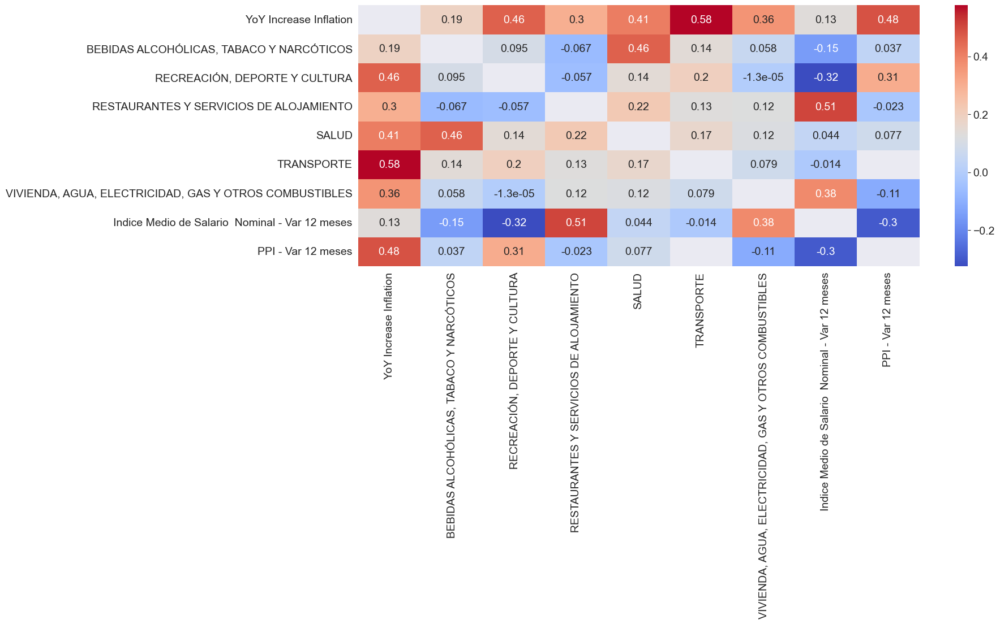

In [ ]:
all_corr = ury[final_predictors].corr()[ury[final_predictors].corr() < 0.8]
sns.heatmap(all_corr, annot = True, cmap = 'coolwarm')

<AxesSubplot: >

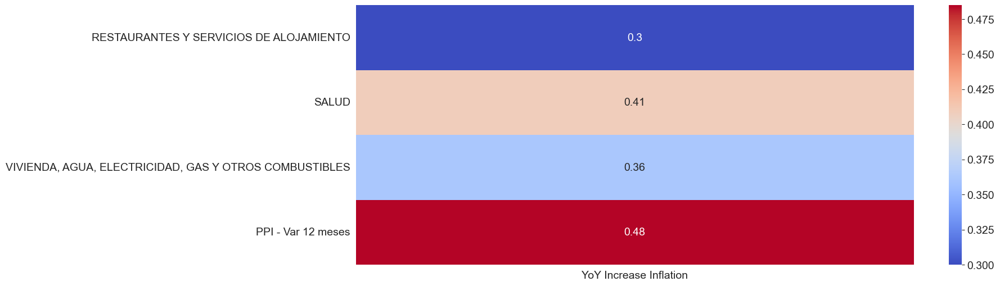

In [ ]:
top_10_corr = ury[top_10_combos].corr().iloc[1:, 0:1]
sns.heatmap(top_10_corr, annot = True, cmap = 'coolwarm')

  0%|          | 0/1 [00:00<?, ?it/s]

searching for best parameters for ARIMA model...
Training  arima for  ury_0402
Fitting ARIMA model for:  ury_0402


100%|██████████| 1/1 [01:41<00:00, 101.98s/it]


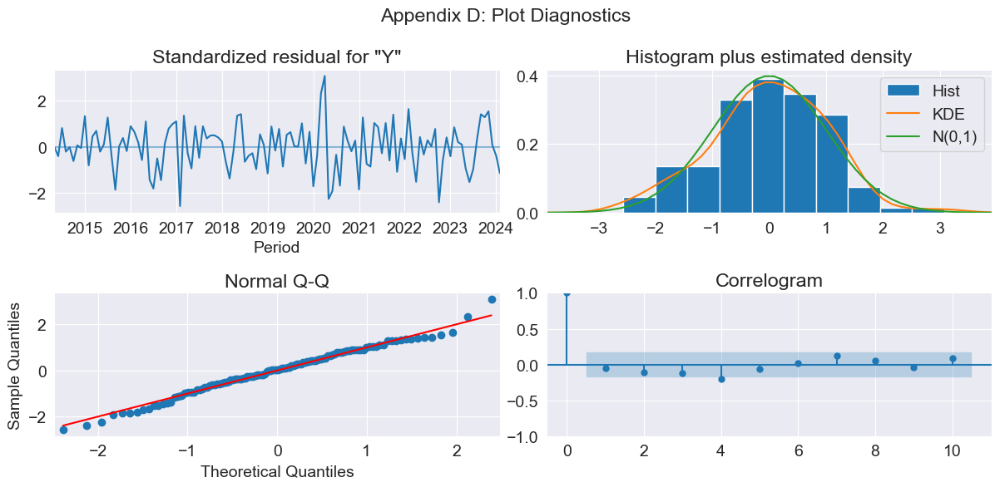

In [32]:
#create_forecast_report({'ury_0402': ury[top_10_combos]}, [], var_model, log_transform = False, walkforward = False)
create_forecast_report({'ury_0402': ury}, [], arima, log_transform = False, walkforward = False)